In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as pylab
from datetime import date, datetime,timedelta
import datetime as dt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.stattools import  adfuller
from statsmodels.tsa.arima.model import ARIMA

import warnings
warnings.filterwarnings("ignore")

In [3]:
# reading data
df= pd.read_csv(r"C:\Users\hemra\Downloads\Aquifer_Petrignano.csv", parse_dates=['Date'])
df.tail()

,Date,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano
5218,2020-06-26,0.0,-25.68,-25.07,25.7,24.5,-29930.688,2.5
5219,2020-06-27,0.0,-25.80,-25.11,26.2,25.0,-31332.960,2.4
5220,2020-06-28,0.0,-25.80,-25.19,26.9,25.7,-32120.928,2.4
5221,2020-06-29,0.0,-25.78,-25.18,26.9,26.0,-30602.880,2.4
5222,2020-06-30,0.0,-25.91,-25.25,27.3,26.5,-31878.144,2.4


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223 entries, 0 to 5222
Data columns (total 8 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Date                                  5223 non-null   datetime64[ns]
 1   Rainfall_Bastia_Umbra                 4199 non-null   float64       
 2   Depth_to_Groundwater_P24              5168 non-null   float64       
 3   Depth_to_Groundwater_P25              5184 non-null   float64       
 4   Temperature_Bastia_Umbra              4199 non-null   float64       
 5   Temperature_Petrignano                4199 non-null   float64       
 6   Volume_C10_Petrignano                 5025 non-null   float64       
 7   Hydrometry_Fiume_Chiascio_Petrignano  4199 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 326.6 KB


In [7]:
# delete null
df= df[df.Rainfall_Bastia_Umbra.notna()].reset_index(drop=True)
df= df.drop(['Depth_to_Groundwater_P24', 'Temperature_Petrignano'], axis=1)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4199 entries, 0 to 4198
Data columns (total 6 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Date                                  4199 non-null   datetime64[ns]
 1   Rainfall_Bastia_Umbra                 4199 non-null   float64       
 2   Depth_to_Groundwater_P25              4172 non-null   float64       
 3   Temperature_Bastia_Umbra              4199 non-null   float64       
 4   Volume_C10_Petrignano                 4198 non-null   float64       
 5   Hydrometry_Fiume_Chiascio_Petrignano  4199 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 197.0 KB


In [11]:
# ploting the data
df.columns= ['date', 'rainfall', 'Depth_to_Groundwater', 
             'Temperature', 'drainage_volume','river_hydrometry']
target= ['Depth_to_Groundwater']
feature= [col for col in df.columns if col not in target]

df.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4
1,2009-01-02,0.0,-31.11,2.3,-28785.888,2.5
2,2009-01-03,0.0,-31.07,4.4,-25766.208,2.4
3,2009-01-04,0.0,-31.05,0.8,-27919.296,2.4
4,2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3


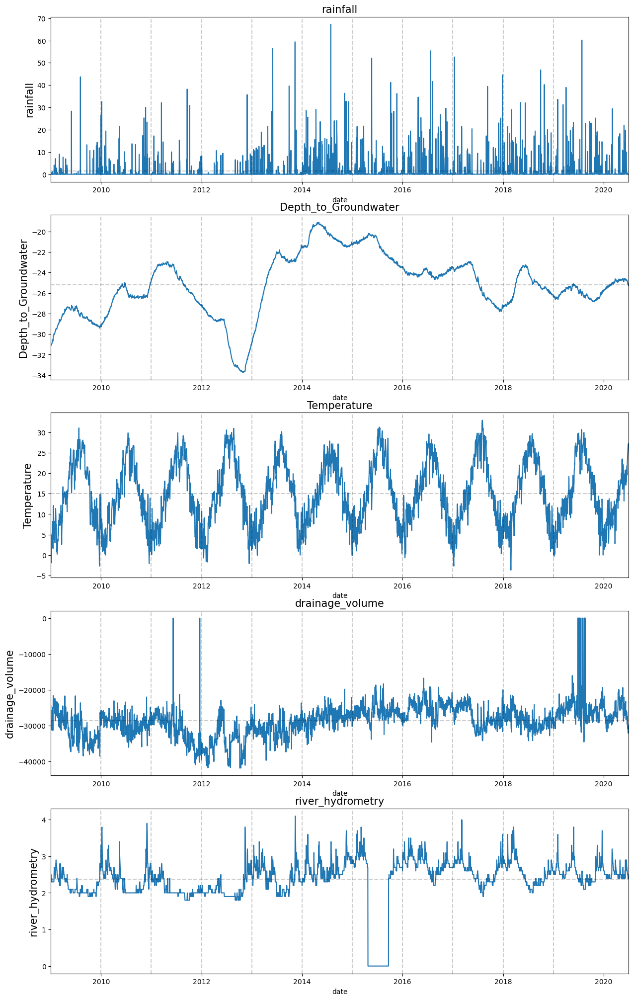

In [13]:
# ploting the data
rwo, ax= plt.subplots(nrows=5, ncols=1, figsize=(15,25))
for i,col in enumerate(df.columns[1:]):
    sns.lineplot(x=df['date'], y=df[col], ax= ax[i])
    ax[i].set_title(col, fontsize= 15)
    ax[i].set_ylabel(col, fontsize=15)
    ax[i].set_xlim([date(2009,1,1), date(2020,6,30)])
    ax[i].axhline(df[col].mean(), color='k', alpha=0.2, linestyle='--')
    for year in range(2009,2020):
             ax[i].axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [15]:
df= df.sort_values(by='date', ignore_index=True)
df.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4
1,2009-01-02,0.0,-31.11,2.3,-28785.888,2.5
2,2009-01-03,0.0,-31.07,4.4,-25766.208,2.4
3,2009-01-04,0.0,-31.05,0.8,-27919.296,2.4
4,2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3


In [17]:
df['delta']= df['date'] - df['date'].shift(1)

In [19]:
df[['date','delta']].head()

,date,delta
0,2009-01-01,NaT
1,2009-01-02,1 days
2,2009-01-03,1 days
3,2009-01-04,1 days
4,2009-01-05,1 days


In [21]:
df['delta'].sum() , df['delta'].count()

(Timedelta('4198 days 00:00:00'), 4198)

In [23]:
index=[]
for i,n in enumerate(df['delta'] == '1 days'):
    if n == False :index.append(i) 
df.iloc[index]

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,delta
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4,NaT


In [25]:
df.set_index('date',inplace=True)
df.asfreq('D')

,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,delta
date,,,,,,
2009-01-01,0.0,-31.14,5.2,-24530.688,2.4,NaT
2009-01-02,0.0,-31.11,2.3,-28785.888,2.5,1 days
2009-01-03,0.0,-31.07,4.4,-25766.208,2.4,1 days
2009-01-04,0.0,-31.05,0.8,-27919.296,2.4,1 days
2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3,1 days
...,...,...,...,...,...,...
2020-06-26,0.0,-25.07,25.7,-29930.688,2.5,1 days
2020-06-27,0.0,-25.11,26.2,-31332.960,2.4,1 days
2020-06-28,0.0,-25.19,26.9,-32120.928,2.4,1 days


In [27]:
df['delta1']= df.index - df.index.shift(freq='D')

In [29]:
df['delta1'].sum() , df['delta1'].count()

(Timedelta('-4199 days +00:00:00'), 4199)

In [31]:
df= df.drop(['delta','delta1'], axis= 1).reset_index() 
df.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry
0,2009-01-01,0.0,-31.14,5.2,-24530.688,2.4
1,2009-01-02,0.0,-31.11,2.3,-28785.888,2.5
2,2009-01-03,0.0,-31.07,4.4,-25766.208,2.4
3,2009-01-04,0.0,-31.05,0.8,-27919.296,2.4
4,2009-01-05,0.0,-31.01,-1.9,-29854.656,2.3


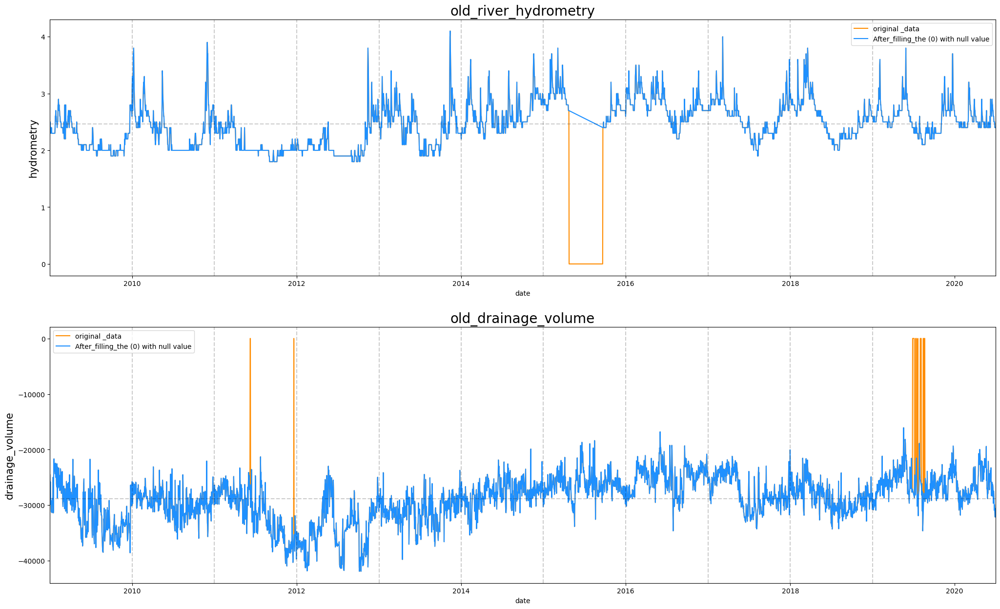

In [33]:
# implement the 0 withthe nulll values to get easy implement in future.

row, ax= plt.subplots(nrows=2, ncols=1, figsize=(25,15))

old_river_hydrometry= df['river_hydrometry'].copy()
old_drainage_volume= df['drainage_volume'].copy()
df['river_hydrometry']= df['river_hydrometry'].replace(0, np.nan)
df['drainage_volume']= df['drainage_volume'].replace(0, np.nan)


sns.lineplot(x=df.date, y=old_river_hydrometry, ax=ax[0], color='darkorange', label='original _data')
sns.lineplot(x=df.date, y=df['river_hydrometry'], ax=ax[0], color='dodgerblue', label='After_filling_the (0) with null value')
ax[0].set_title('old_river_hydrometry', fontsize= 20)
ax[0].set_ylabel('hydrometry',fontsize= 15 )
ax[0].set_xlim([datetime(2009,1,1)], datetime(2020,6,30))
ax[0].axhline(df['river_hydrometry'].mean(), color='k', linestyle='--', alpha=0.2)
for year in range(2009,2020):
                 ax[0].axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
        

sns.lineplot(x=df.date, y=old_drainage_volume, ax=ax[1], color='darkorange', label='original _data')
sns.lineplot(x=df.date, y=df['drainage_volume'], ax=ax[1], color='dodgerblue', label='After_filling_the (0) with null value')
ax[1].set_title('old_drainage_volume' , fontsize= 20)
ax[1].set_ylabel('drainage_volume' ,fontsize= 15 )
ax[1].set_xlim([datetime(2009,1,1)], datetime(2020,6,30))
ax[1].axhline(df['drainage_volume'].mean(), color='k', linestyle='--', alpha=0.2)
for year in range(2009,2020):
                 ax[1].axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

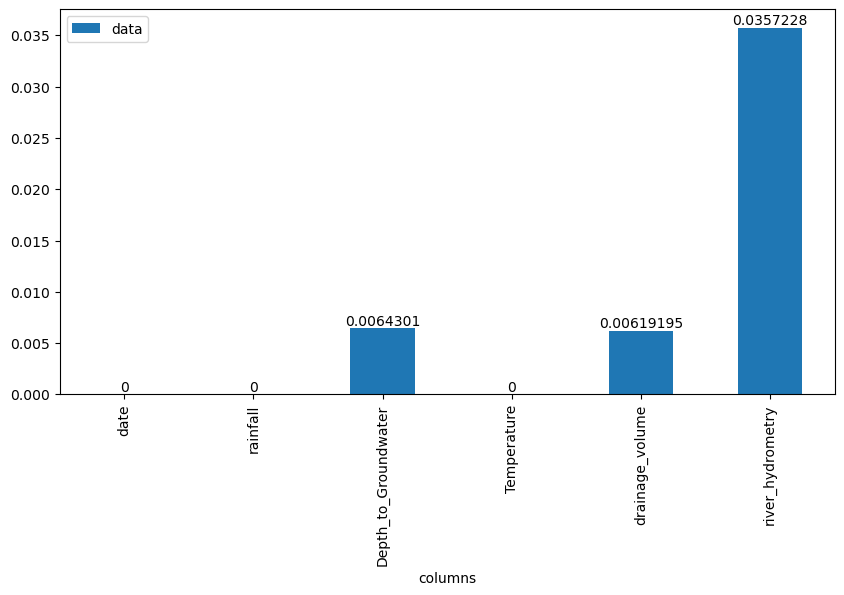

In [35]:
# ploting the ratio of the null values in our data.
def null_ratio(df):
    null= [(col, df[col].isnull().sum() / len(df)) for col in df.columns 
           if df[col].isnull().sum() >= 0]
    col= ['columns', 'data']
    data= pd.DataFrame(null, columns=col)
    pylab.rcParams['figure.figsize']=(10,5)
    ax= data.plot(kind="bar", x='columns', y='data')
    ax.bar_label(ax.containers[0])
        
null_ratio(df)

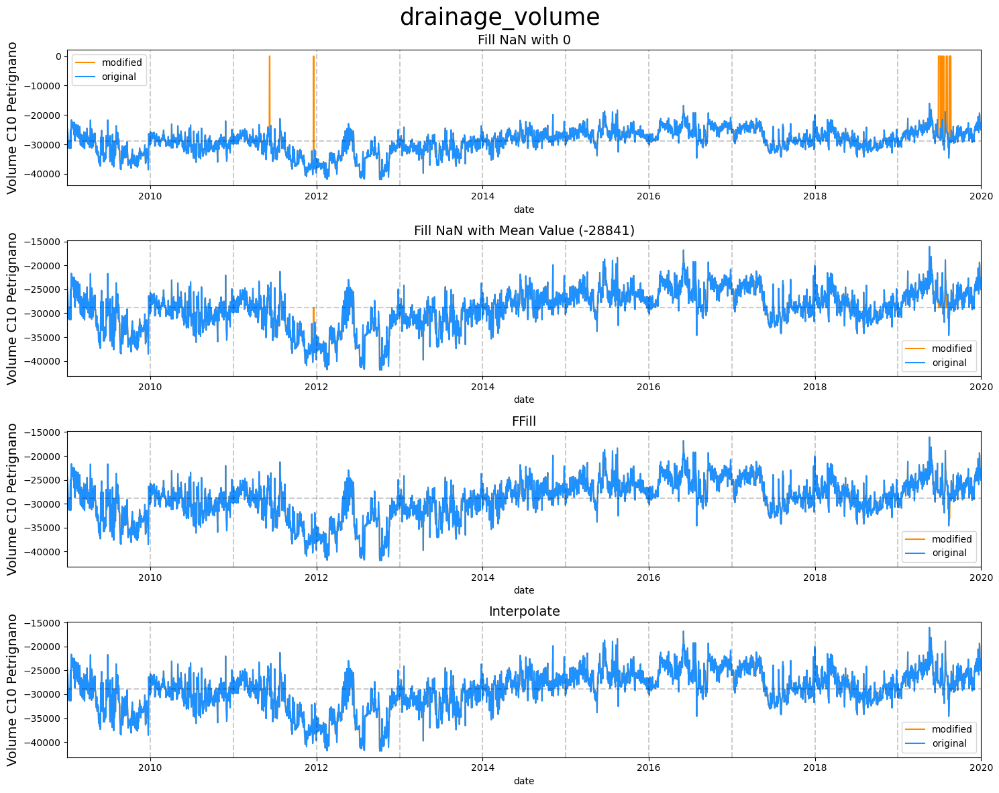

In [37]:
# comparing multi methods to fill the null values in the data.

def compare(col):
    
    f, ax = plt.subplots(nrows=4, ncols=1, figsize=(15, 12))
    f.suptitle('{}'.format(col) , fontsize= 25)

    sns.lineplot(x=df['date'], y=df[col].fillna(0), ax=ax[0], color='darkorange', label = 'modified')
    sns.lineplot(x=df['date'], y=df[col], ax=ax[0], color='dodgerblue', label = 'original')
    ax[0].set_title('Fill NaN with 0', fontsize=14)
    ax[0].set_ylabel(ylabel='Volume C10 Petrignano', fontsize=14)
    ax[0].axhline(df[col].mean(), linestyle='--', color='k', alpha=0.2)


    mean_drainage = df[col].mean()
    sns.lineplot(x=df['date'], y=df[col].fillna(mean_drainage), ax=ax[1], color='darkorange', label = 'modified')
    sns.lineplot(x=df['date'], y=df[col], ax=ax[1], color='dodgerblue', label = 'original')
    ax[1].set_title(f'Fill NaN with Mean Value ({mean_drainage:.0f})', fontsize=14)
    ax[1].set_ylabel(ylabel='Volume C10 Petrignano', fontsize=14)
    ax[1].axhline(df[col].mean(), linestyle='--', color='k', alpha=0.2)


    sns.lineplot(x=df['date'], y=df[col].ffill(), ax=ax[2], color='darkorange', label = 'modified')
    sns.lineplot(x=df['date'], y=df[col], ax=ax[2], color='dodgerblue', label = 'original')
    ax[2].set_title(f'FFill', fontsize=14)
    ax[2].set_ylabel(ylabel='Volume C10 Petrignano', fontsize=14)
    ax[2].axhline(df[col].mean(), linestyle='--', color='k', alpha=0.2)


    sns.lineplot(x=df['date'], y=df[col].interpolate(), ax=ax[3], color='darkorange', label = 'modified')
    sns.lineplot(x=df['date'], y=df[col], ax=ax[3], color='dodgerblue', label = 'original')
    ax[3].set_title(f'Interpolate', fontsize=14)
    ax[3].set_ylabel(ylabel='Volume C10 Petrignano', fontsize=14)
    ax[3].axhline(df[col].mean(), linestyle='--', color='k', alpha=0.2)
    

    for i in range(4):
        for year in range(2009,2020):
            ax[i].axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
            

    for i in range(4):
        ax[i].set_xlim([date(2009, 1, 1), date(2020, 1, 1)])
    
    plt.tight_layout()
    plt.show()

compare('drainage_volume') 

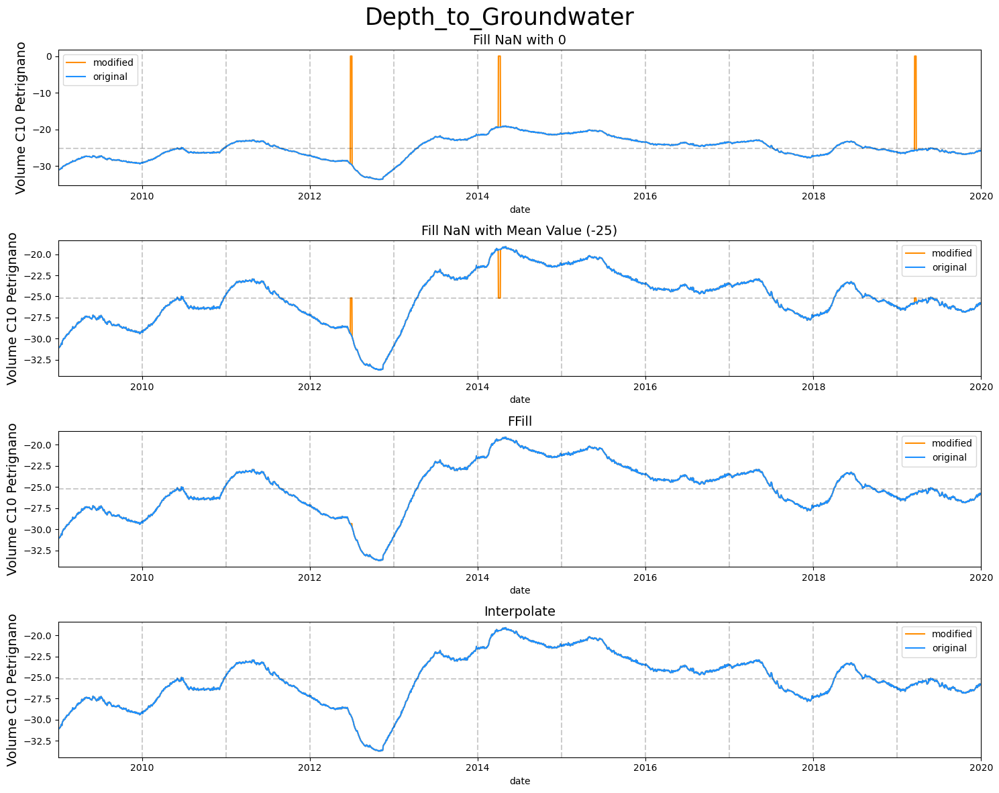

In [39]:
compare('Depth_to_Groundwater') 

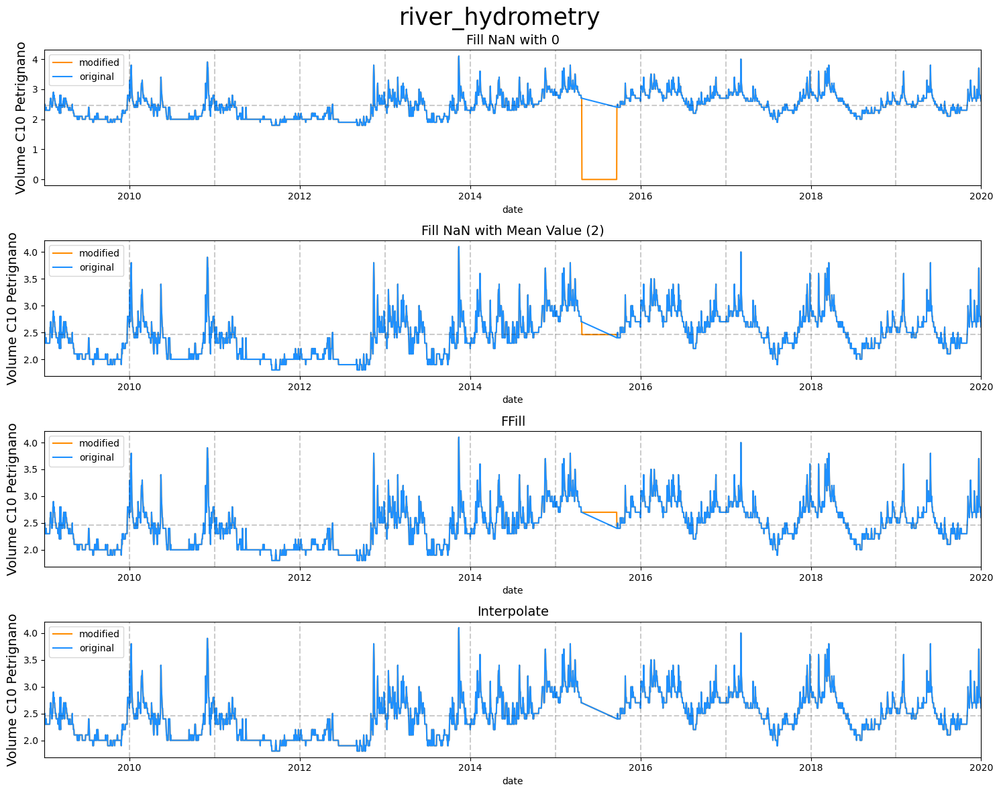

In [41]:
compare('river_hydrometry')

In [43]:
df['river_hydrometry']= df.river_hydrometry.interpolate()
df['Depth_to_Groundwater']= df.Depth_to_Groundwater.interpolate()
df['drainage_volume']= df.drainage_volume.interpolate()

In [45]:
df.isnull().sum()

date                    0
rainfall                0
Depth_to_Groundwater    0
Temperature             0
drainage_volume         0
river_hydrometry        0
dtype: int64

In [47]:
# resample our data to add more insights.
df[['date','drainage_volume']].resample('7D', on='date').sum().reset_index()

,date,drainage_volume
0,2009-01-01,-197154.432
1,2009-01-08,-208290.528
2,2009-01-15,-178242.336
3,2009-01-22,-166980.960
4,2009-01-29,-176473.728
...,...,...
595,2020-05-28,-179137.440
596,2020-06-04,-171969.696
597,2020-06-11,-190248.912
598,2020-06-18,-196210.944


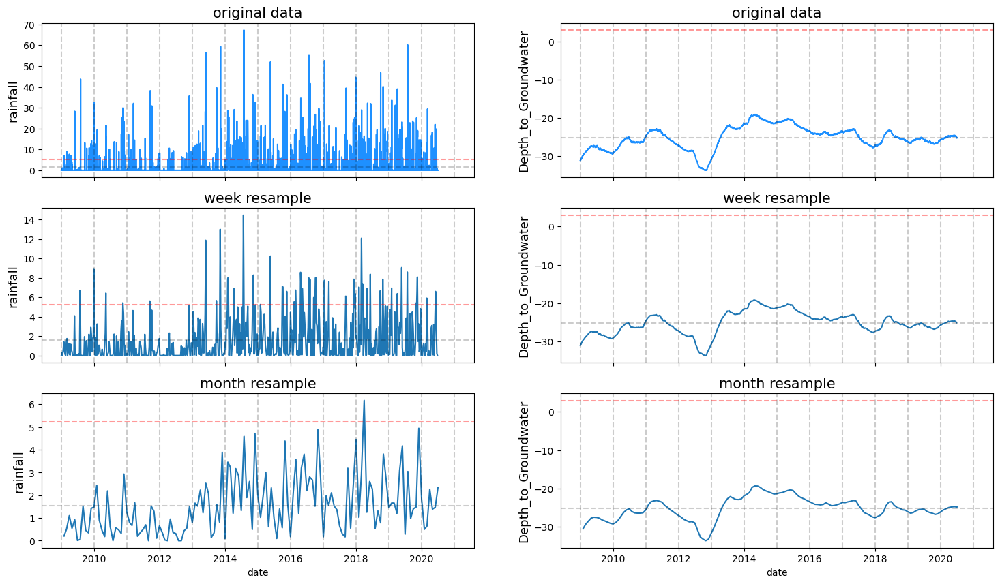

In [51]:
def downsample(col, cola):
    row, ax = plt.subplots(ncols=2, nrows=3, sharex=True, figsize=(18, 10))

    week_resample = df[['date', col]].resample('7D', on='date').mean().reset_index()
    month_resample = df[['date', col]].resample('M', on='date').mean().reset_index()

    sns.lineplot(x='date', y=col, data=df, color='dodgerblue', ax=ax[0, 0])
    ax[0, 0].set_title('original data', fontsize=15)
    ax[0, 0].set_ylabel(col, fontsize=13)

    sns.lineplot(x='date', y=col, data=week_resample, ax=ax[1, 0])
    ax[1, 0].set_title('week resample', fontsize=15)
    ax[1, 0].set_ylabel(col, fontsize=13)

    sns.lineplot(x='date', y=col, data=month_resample, ax=ax[2, 0])
    ax[2, 0].set_title('month resample', fontsize=15)
    ax[2, 0].set_ylabel(col, fontsize=13)

    for i in range(3):
        for year in range(2009, 2022):
            ax[i, 0].axvline(pd.to_datetime(str(year) + '-01-01'), color='k', linestyle='--', alpha=0.2)

    for i in range(3):
        ax[i, 0].axhline(df[col].mean(), color='k', linestyle='--', alpha=0.2)

    for i in range(3):
        ax[i, 0].axhline(df[col].std(), color='r', linestyle='--', alpha=0.4, label='mean')

    week_resample = df[['date', cola]].resample('7D', on='date').mean().reset_index()
    month_resample = df[['date', cola]].resample('M', on='date').mean().reset_index()

    sns.lineplot(x='date', y=cola, data=df, color='dodgerblue', ax=ax[0, 1])
    ax[0, 1].set_title('original data', fontsize=15)
    ax[0, 1].set_ylabel(cola, fontsize=13)

    sns.lineplot(x='date', y=cola, data=week_resample, ax=ax[1, 1])
    ax[1, 1].set_title('week resample', fontsize=15)
    ax[1, 1].set_ylabel(cola, fontsize=13)

    sns.lineplot(x='date', y=cola, data=month_resample, ax=ax[2, 1])
    ax[2, 1].set_title('month resample', fontsize=15)
    ax[2, 1].set_ylabel(cola, fontsize=13)

    for i in range(3):
        for year in range(2009, 2022):
            ax[i, 1].axvline(pd.to_datetime(str(year) + '-01-01'), color='k', linestyle='--', alpha=0.2)

    for i in range(3):
        ax[i, 1].axhline(df[cola].mean(), color='k', linestyle='--', alpha=0.2)

    for i in range(3):
        ax[i, 1].axhline(df[cola].std(), color='r', linestyle='--', alpha=0.4, label='std')

    plt.show()

downsample('rainfall', 'Depth_to_Groundwater')


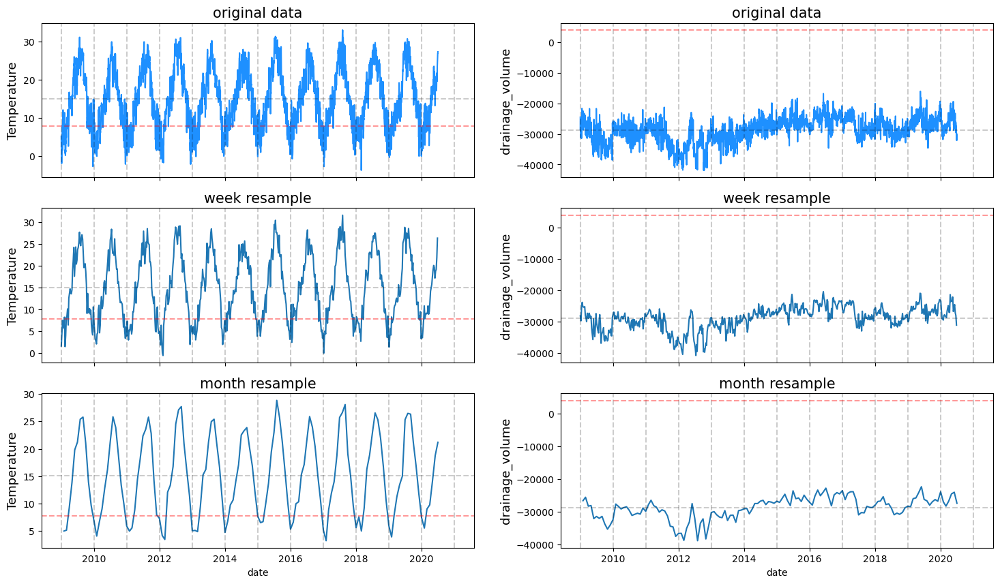

In [53]:
downsample('Temperature','drainage_volume')

In [55]:
df.columns

Index(['date', 'rainfall', 'Depth_to_Groundwater', 'Temperature',
       'drainage_volume', 'river_hydrometry'],
      dtype='object')

In [57]:
df= df[['date', 'rainfall', 'Depth_to_Groundwater', 'Temperature',
       'drainage_volume', 'river_hydrometry']].resample('7D',on='date').mean().reset_index().ffill()

In [59]:
df.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry
0,2009-01-01,0.000000,-31.048571,1.657143,-28164.918857,2.371429
1,2009-01-08,0.285714,-30.784286,4.571429,-29755.789714,2.314286
2,2009-01-15,0.028571,-30.420000,7.528571,-25463.190857,2.300000
3,2009-01-22,0.585714,-30.018571,6.214286,-23854.422857,2.500000
4,2009-01-29,1.414286,-29.790000,5.771429,-25210.532571,2.500000


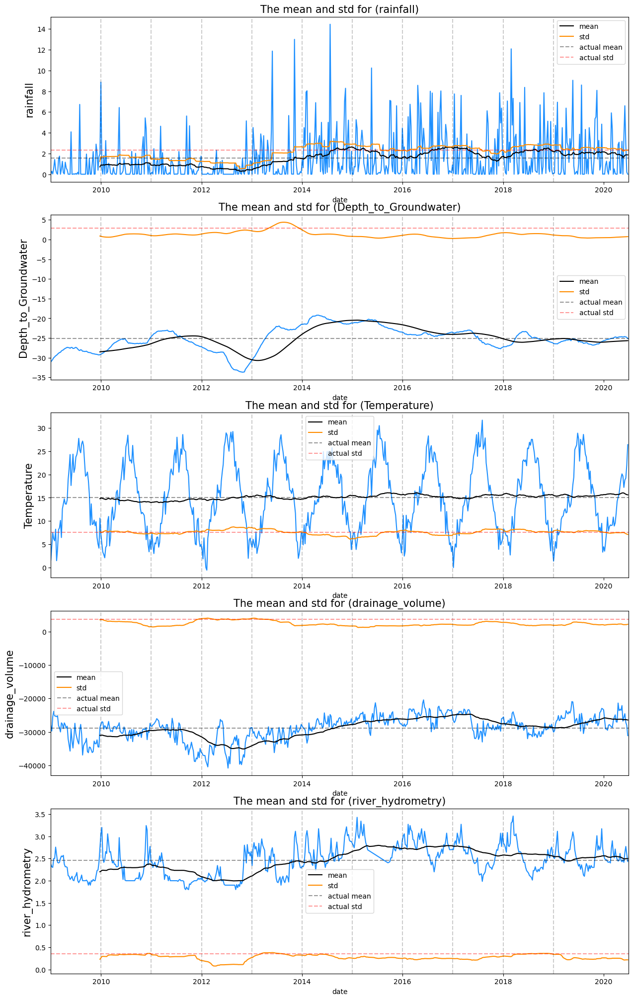

In [79]:
# cheking the conistent mean and std for the data
window = 52
fig, ax = plt.subplots(ncols=1, nrows=5, figsize=(15, 25))

for i, col in enumerate(df.columns[1:]):
    # Plot the original data
    sns.lineplot(x='date', y=col, data=df, ax=ax[i], color='dodgerblue')
    
    # Plot the rolling mean
    sns.lineplot(x=df['date'], y=df[col].rolling(window).mean(), ax=ax[i], color='black', label='mean')
    
    # Plot the rolling standard deviation
    sns.lineplot(x=df['date'], y=df[col].rolling(window).std(), ax=ax[i], color='darkorange', label='std')
    
    ax[i].set_title(f'The mean and std for ({col})', fontsize=15)
    ax[i].set_ylabel(col, fontsize=15)
    ax[i].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])
    
    # Add vertical lines for each year
    for year in range(2009, 2020):
        ax[i].axvline(pd.to_datetime(str(year) + '-01-01'), color='k', linestyle='--', alpha=0.2)
    
    # Add horizontal lines for the actual mean and standard deviation
    ax[i].axhline(df[col].mean(), color='k', linestyle='--', alpha=0.4, label='actual mean')
    ax[i].axhline(df[col].std(), color='r', linestyle='--', alpha=0.4, label='actual std')
    
    ax[i].legend()

plt.show()

In [81]:
test= adfuller(df['rainfall'].values)

In [83]:
test[0], test[1]

(-3.3739124992536405, 0.01188099899936043)

In [85]:
test

(-3.3739124992536405,
 0.01188099899936043,
 15,
 584,
 {'1%': -3.4415970480373046,
  '5%': -2.866501759246704,
  '10%': -2.5694124827594296},
 2615.3909698442303)

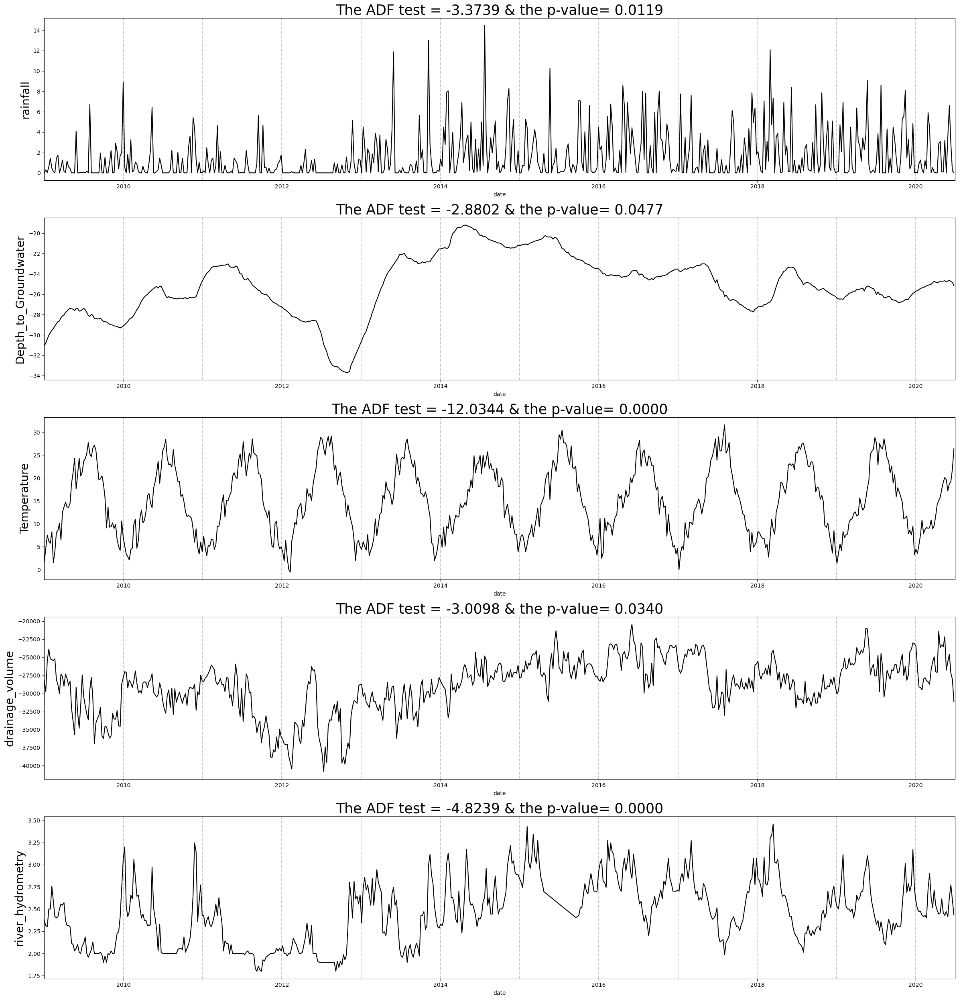

In [87]:
alpha = 0.05
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(24, 25))

for i, col in enumerate(df.columns[1:]):
    test = adfuller(df[col].values)

    # Set color based on p-value
    if test[1] > alpha:
        color = 'darkorange'
    else:
        color = 'black'
    
    # Plot the data with correct x and y arguments
    sns.lineplot(x=df['date'], y=df[col], ax=ax[i], color=color)
    
    # Set the title to show the ADF test statistic and p-value
    ax[i].set_title(f'The ADF test = {test[0]:.4f} & the p-value= {test[1]:.4f}', fontsize=25)
    
    # Set x-axis limits
    ax[i].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])
    
    # Set y-axis label
    ax[i].set_ylabel(col, fontsize=20)
    
    # Add vertical lines for each year
    for year in range(2009, 2021):
        ax[i].axvline(pd.to_datetime(f'{year}-01-01'), linestyle='--', color='k', alpha=0.2)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

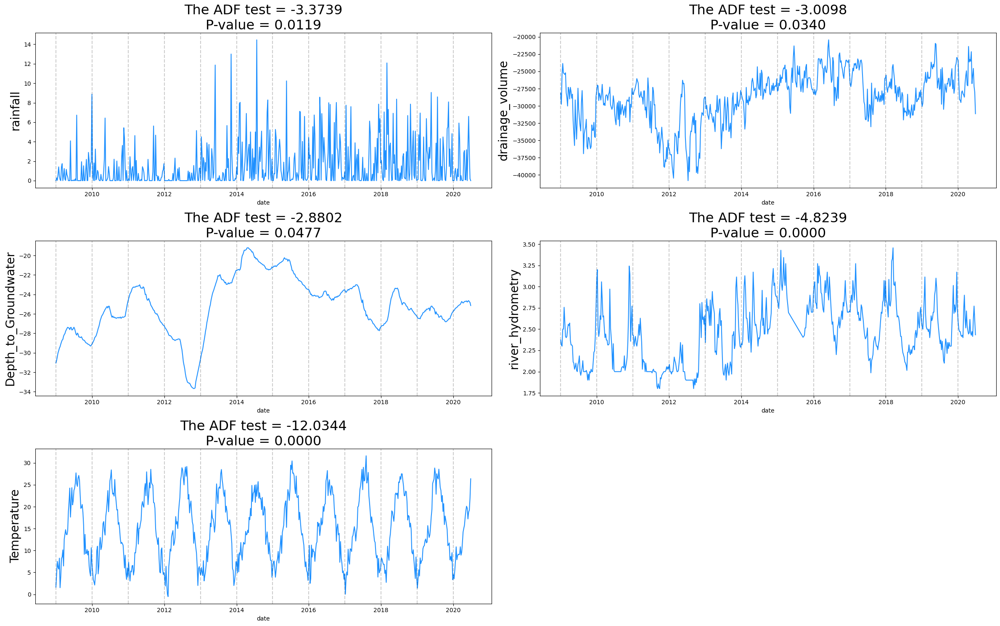

In [91]:
# adf test for stationary.
alpha = 0.05
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(24, 15))

def compa(ax, col):
    # Perform the ADF test
    test = adfuller(df[col].values)
    
    # Set color based on p-value
    if test[1] > alpha:
        color = 'darkorange'
    else:
        color = 'dodgerblue'
    
    # Plot the data with correct x and y arguments
    sns.lineplot(x=df['date'], y=df[col], ax=ax, color=color)
    
    # Set the title with the ADF test statistic and p-value
    ax.set_title(f'The ADF test = {test[0]:.4f}\nP-value = {test[1]:.4f}', fontsize=23)
    
    # Set y-axis label
    ax.set_ylabel(col, fontsize=20)
    
    # Add vertical lines for each year
    for year in range(2009, 2021):
        ax.axvline(pd.to_datetime(f'{year}-01-01'), linestyle='--', color='k', alpha=0.2)

# Apply the comparison function to each plot
compa(ax[0, 0], 'rainfall')
compa(ax[1, 0], 'Depth_to_Groundwater')
compa(ax[2, 0], 'Temperature')
compa(ax[0, 1], 'drainage_volume')
compa(ax[1, 1], 'river_hydrometry')

# Adjust layout for better spacing
plt.tight_layout()

# Remove the last empty axis (bottom right corner)
ax[2, 1].remove()

plt.show()

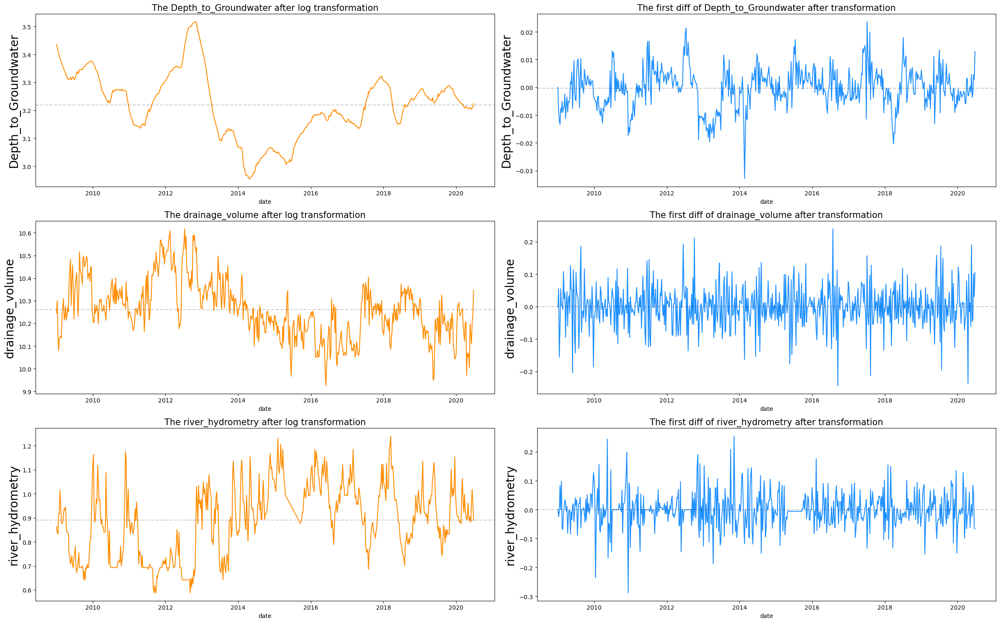

In [93]:
df_ = df.copy()  # Copy the original dataframe

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(24, 15))

def trans(ax1, col, ax):
    # Avoiding log of zero by adding a small constant
    df_[col] = np.log(abs(df_[col]) + 1e-6)
    
    # Plot the transformed data (log)
    sns.lineplot(x=df_['date'], y=df_[col], ax=ax1, color='darkorange')
    ax1.set_ylabel(col, fontsize=20)
    ax1.set_title(f'The {col} after log transformation', fontsize=15)
    ax1.axhline(df_[col].mean(), linestyle='--', color='k', alpha=0.2)

    # First difference after log transformation
    df_[col] = df_[col].diff().fillna(0)
    sns.lineplot(x=df_['date'], y=df_[col], ax=ax, color='dodgerblue')
    ax.set_ylabel(col, fontsize=20)
    ax.set_title(f'The first diff of {col} after transformation', fontsize=15)
    ax.axhline(df_[col].mean(), linestyle='--', color='k', alpha=0.2)

# Apply transformation and plotting to different columns
trans(ax[0, 0], 'Depth_to_Groundwater', ax[0, 1])
trans(ax[1, 0], 'drainage_volume', ax[1, 1])
trans(ax[2, 0], 'river_hydrometry', ax[2, 1])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

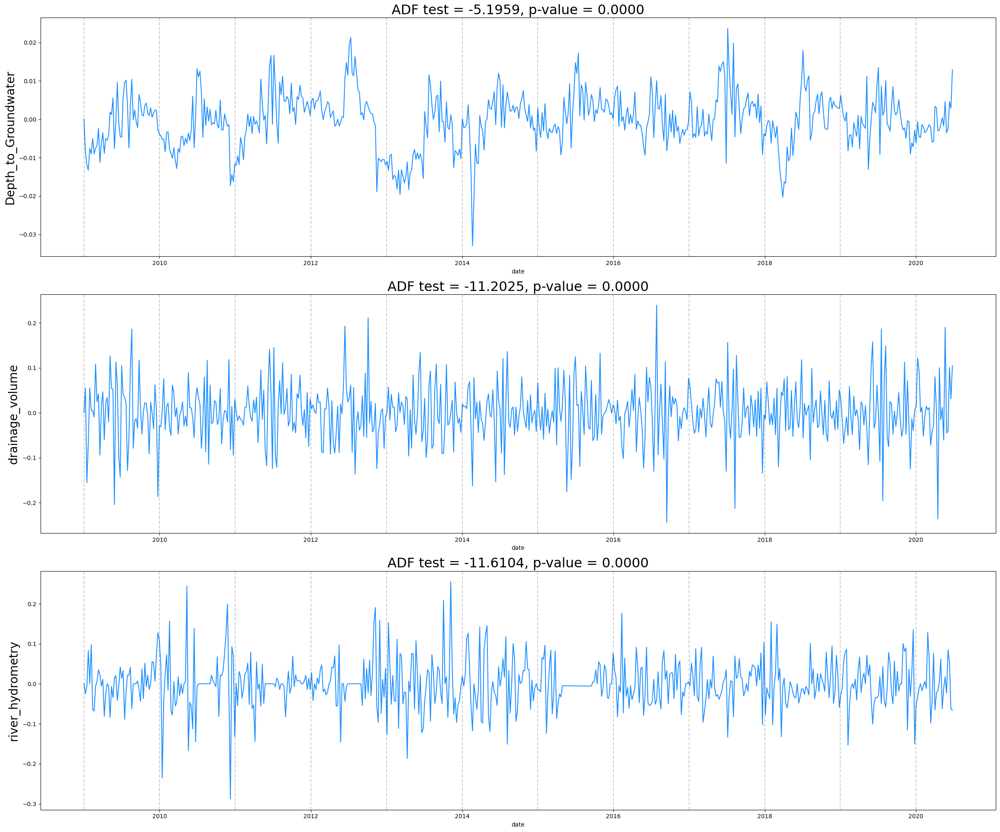

In [95]:
alpha = 0.05
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(24, 20))

def compa(ax, col):
    # Perform ADF test for stationarity
    test = adfuller(df_[col].values)
    
    # Set color based on p-value
    if test[1] > alpha:
        color = 'darkorange'
    else:
        color = 'dodgerblue'
        
    # Plot the data
    sns.lineplot(x=df_['date'], y=df_[col], ax=ax, color=color)
    
    # Set title with ADF test results and p-value
    ax.set_title(f'ADF test = {test[0]:.4f}, p-value = {test[1]:.4f}', fontsize=23)
    ax.set_ylabel(col, fontsize=20)
    
    # Add vertical lines at the start of each year
    for year in range(2009, 2021):
        ax.axvline(pd.to_datetime(f'{year}-01-01'), linestyle='--', color='k', alpha=0.2)

# Apply comparison function to each column
compa(ax[0], 'Depth_to_Groundwater')
compa(ax[1], 'drainage_volume')
compa(ax[2], 'river_hydrometry')

# Adjust layout
plt.tight_layout()
plt.show()

In [97]:
# feature engineering

def feature_eng(col):
    df_['year']= pd.DatetimeIndex(df_[col]).year
    df_['month']= pd.DatetimeIndex(df_[col]).month
    df_['week']=df_['date'].dt.isocalendar().week
    df_['day']= pd.DatetimeIndex(df_[col]).day
    df_['quarter']= pd.DatetimeIndex(df_[col]).quarter
    df_['season']= df_['month']% 12 // 3+1
    
    season={12:'Winter', 1:'Winter', 2:'Winter',
            3:'Spring', 4:'Spring', 5:'Spring',
            6:'Summer', 7:'Summer', 8:'Summer',
            9:'Autumn', 10:'Autumn', 11:'Autumn'}
    
    df_['seas']= df_['month'].apply(lambda x: season[x])
    
feature_eng('date')
df_.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,year,month,week,day,quarter,season,seas
0,2009-01-01,0.000000,0.000000,1.657143,0.000000,0.000000,2009,1,1,1,1,1,Winter
1,2009-01-08,0.285714,-0.008548,4.571429,0.054947,-0.024391,2009,1,2,8,1,1,Winter
2,2009-01-15,0.028571,-0.011904,7.528571,-0.155790,-0.006192,2009,1,3,15,1,1,Winter
3,2009-01-22,0.585714,-0.013284,6.214286,-0.065264,0.083382,2009,1,4,22,1,1,Winter
4,2009-01-29,1.414286,-0.007643,5.771429,0.055292,0.000000,2009,1,5,29,1,1,Winter


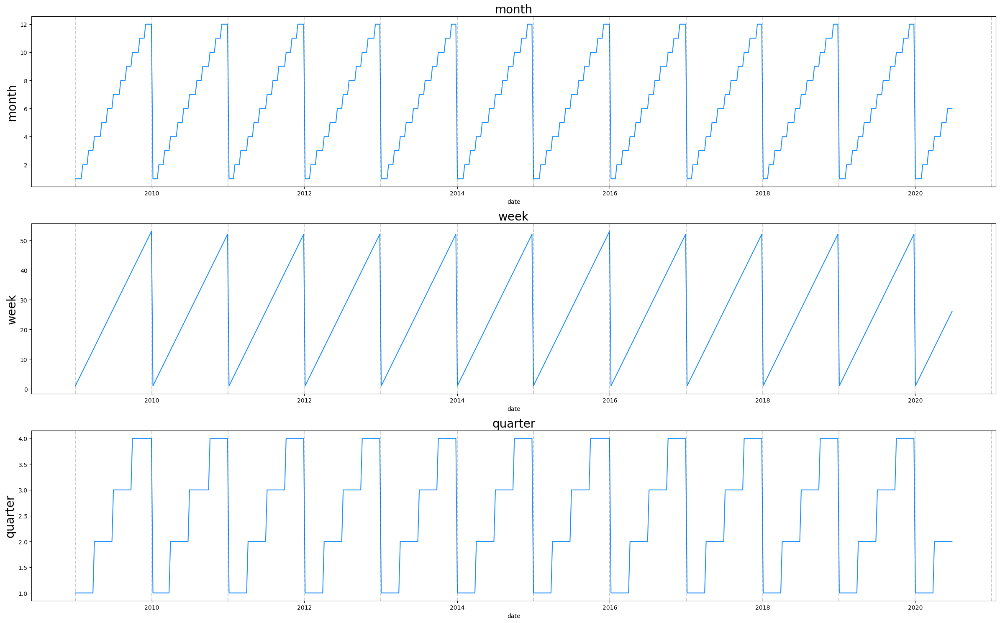

In [101]:
# check the Cycle in the months & weeks
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(24,15))

# Adjust the column selection if needed; for now, I'm assuming you want 'month', 'week', and possibly other time-based features.
# This is based on columns added by feature engineering.
cycle_columns = ['month', 'week', 'quarter']  # Adjust based on your actual columns

for i, col in enumerate(cycle_columns):
    sns.lineplot(x='date', y=col, data=df_, ax=ax[i], color='dodgerblue')
    ax[i].set_title(col, fontsize=20)
    ax[i].set_ylabel(col, fontsize=20)

    # Adding vertical lines for each year
    for year in range(2009, 2022):
        ax[i].axvline(pd.to_datetime(str(year) + '-01-01'), color='k', linestyle='--', alpha=0.2)

plt.tight_layout()


In [103]:
# encoding the Cyclical Features using get_dummies
ex_df=df_.copy()
ex_df= ex_df.set_index(df['date'])
ex_df.drop(['date','month'], inplace=True, axis=1)
ex_df= ex_df.asfreq('d').ffill()
ex_df['month']= pd.DatetimeIndex(ex_df.index).month
ex_df= pd.get_dummies(ex_df, columns=['month'], drop_first=True)
ex_df= ex_df[['month_2',
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8',
       'month_9', 'month_10', 'month_11', 'month_12']]

ex_df= ex_df.loc['2009-01-01':'2011-01-01']
ex_df

,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
date,,,,,,,,,,,
2009-01-01,False,False,False,False,False,False,False,False,False,False,False
2009-01-02,False,False,False,False,False,False,False,False,False,False,False
2009-01-03,False,False,False,False,False,False,False,False,False,False,False
2009-01-04,False,False,False,False,False,False,False,False,False,False,False
2009-01-05,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
2010-12-28,False,False,False,False,False,False,False,False,False,False,True
2010-12-29,False,False,False,False,False,False,False,False,False,False,True
2010-12-30,False,False,False,False,False,False,False,False,False,False,True


<Axes: xlabel='date'>

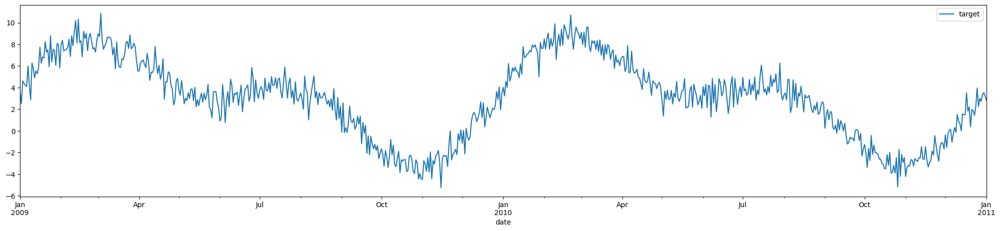

In [107]:
# making a target to test get_dummies method
ex_df['n_day']= range(len(ex_df))

signal_1 = 3 + 4 * np.sin(ex_df["n_day"] / 365 * 2 * np.pi)
signal_2 = 3 * np.sin(ex_df["n_day"] / 365 * 4 * np.pi + 365/2)
noise = np.random.normal(0, 0.85, len(ex_df))

# combine them to get the target series
y = signal_1 + signal_2 + noise

y= y.to_frame()
y.columns = ['target']
y= y.set_index(ex_df.index)
y.plot(figsize=(25,5))

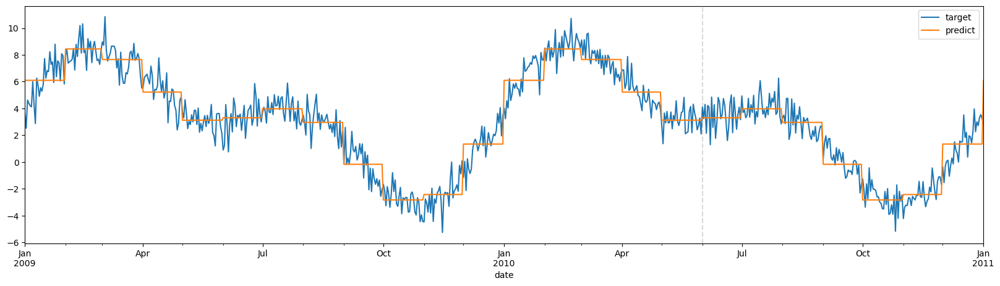

In [109]:
# train the our model for testing
from sklearn.linear_model import LinearRegression

train_end= datetime(2010,6,1)
ex_df.drop('n_day', inplace=True, axis=1)

model= LinearRegression().fit(ex_df.loc[:train_end], y.loc[:train_end])

y['predict']= model.predict(ex_df)
y[['target', 'predict']].plot(figsize=(20,5))

plt.axvline(train_end, linestyle='--', color='k', alpha=0.15)

In [111]:
# using sin and cos method
from sklearn.preprocessing import FunctionTransformer

def sin_transform(period):
    return FunctionTransformer(lambda x: np.sin(x/period*2*np.pi))
    
def cos_transform(period):
    return FunctionTransformer(lambda x: np.cos(x/period*2*np.pi))

In [121]:
ex_df1 = pd.DataFrame(index=ex_df.index)
ex_df2 = pd.DataFrame(index=ex_df.index)

In [125]:
# making a dataframe for both month and weeks to see the Effect of the sin and cos method
ex_df1['month'] = ex_df.index.month
ex_df2['week'] = ex_df.index.isocalendar().week

In [127]:
ex_df1['month_sin']= sin_transform(12).fit_transform(ex_df1)['month']
ex_df1['month_cos']= cos_transform(12).fit_transform(ex_df1)['month']
ex_df1.head()

,month,month_sin,month_cos
date,,,
2009-01-01,1,0.5,0.866025
2009-01-02,1,0.5,0.866025
2009-01-03,1,0.5,0.866025
2009-01-04,1,0.5,0.866025
2009-01-05,1,0.5,0.866025


In [129]:
ex_df2['week_sin']= sin_transform(53).fit_transform(ex_df2)['week']
ex_df2['week_cos']= cos_transform(53).fit_transform(ex_df2)['week']
ex_df2.head()

,week,week_sin,week_cos
date,,,
2009-01-01,1,0.118273,0.992981
2009-01-02,1,0.118273,0.992981
2009-01-03,1,0.118273,0.992981
2009-01-04,1,0.118273,0.992981
2009-01-05,2,0.234886,0.972023


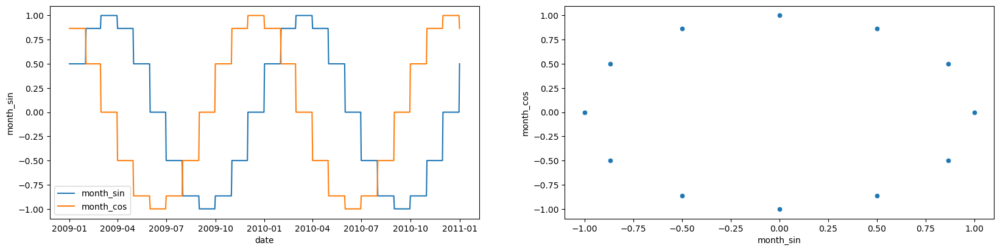

In [131]:
# ploting the month_sin and month_cos
fig, ax= plt.subplots(nrows=2,ncols=2,figsize=(20,10))

sns.lineplot(x=ex_df1.index, y=ex_df1['month_sin'],ax=ax[0,0], label='month_sin')
sns.lineplot(x=ex_df1.index, y=ex_df1['month_cos'],ax=ax[0,0], label='month_cos')

sns.scatterplot(x=ex_df1['month_sin'], y=ex_df1['month_cos'],ax=ax[0,1])

ax[1,0].remove()
ax[1,1].remove()

In [133]:
ex_df3= ex_df1.copy()
ex_df3.drop('month',axis=1, inplace=True)

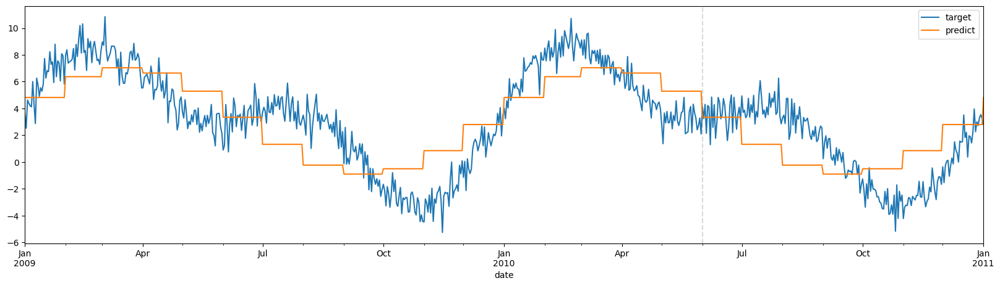

In [135]:
# testing our month_cos and month_sin on our target
train_end= datetime(2010,6,1)

model= LinearRegression().fit(ex_df3.loc[:train_end], y.loc[:train_end])

y['predict']= model.predict(ex_df3)
y[['target', 'predict']].plot(figsize=(20,5))

plt.axvline(train_end, linestyle='--', color='k', alpha=0.15)

In [155]:
ex_df4= ex_df2.copy()
ex_df4.drop('week',axis=1, inplace=True)

In [187]:
predictions = model.predict(ex_df4)
print(len(predictions))
print(len(y))
if len(predictions) < len(y):
    y = y.iloc[:len(predictions)]
print(ex_df4.loc[:train_end].shape)
print(y.loc[:train_end].shape)


731
732
(517, 2)
(517, 1)


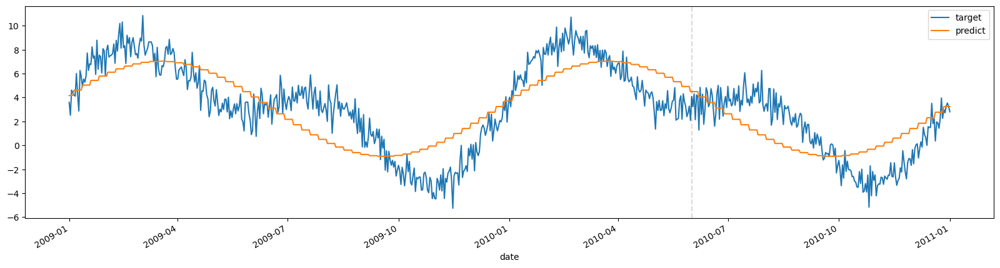

In [189]:
# Fit the model
model = LinearRegression().fit(ex_df4.loc[:train_end], y.loc[:train_end])

# Generate predictions
predictions = model.predict(ex_df4)

# Ensure y has the same length as predictions
y = y.iloc[:len(predictions)]

# Add predictions to the DataFrame
y['predict'] = predictions

# Plot the results
y[['target', 'predict']].plot(figsize=(20, 5))
plt.axvline(train_end, linestyle='--', color='k', alpha=0.15)
plt.show()


In [193]:
# testing RepeatingBasis method
from sklego.preprocessing import RepeatingBasisFunction

model= RepeatingBasisFunction(n_periods=12,
                             column='month',
                             input_range=(1,12),
                             remainder='drop')

model.fit(ex_df1)

ex_df3= pd.DataFrame(index= ex_df1.index, data= model.transform(ex_df1))

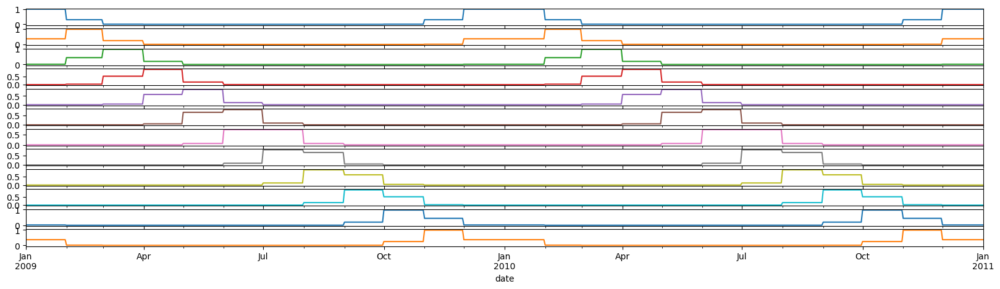

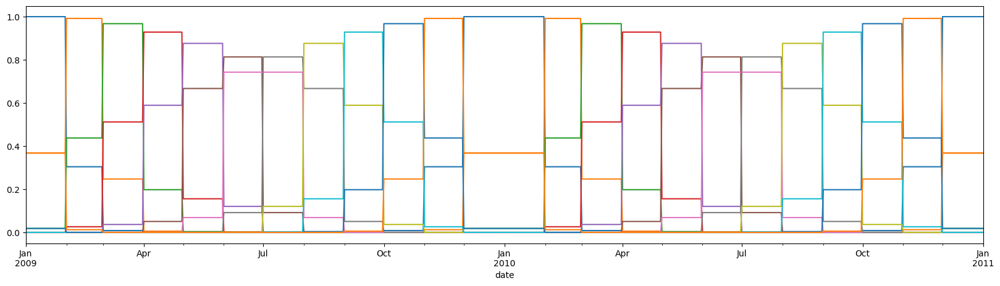

In [195]:
ex_df3.plot(subplots=True,figsize=(20,5),legend=False);
ex_df3.plot(figsize=(20,5),legend=False);

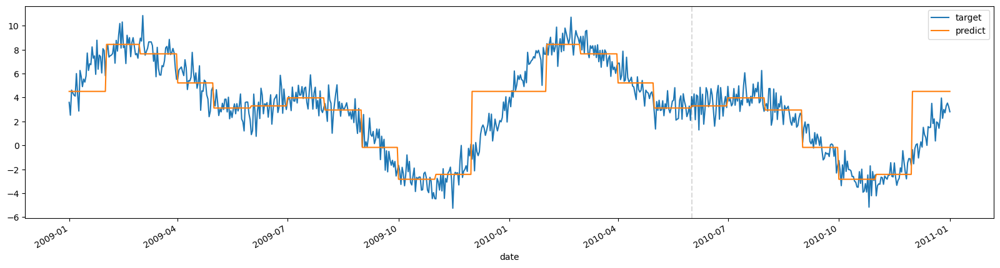

In [197]:
train_end= datetime(2010,6,1)

model= LinearRegression().fit(ex_df3.loc[:train_end], y.loc[:train_end])

y['predict']= model.predict(ex_df3)
y[['target', 'predict']].plot(figsize=(20,5))

plt.axvline(train_end, linestyle='--', color='k', alpha=0.15)

In [199]:
# chosing the week_sin and week_cos instant the month_sin and month_cos for as new feature

df_['week_sin']= sin_transform(53).fit_transform(df_['week'])
df_['week_cos']= cos_transform(53).fit_transform(df_['week'])
df_.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,year,month,week,day,quarter,season,seas,week_sin,week_cos
0,2009-01-01,0.000000,0.000000,1.657143,0.000000,0.000000,2009,1,1,1,1,1,Winter,0.118273,0.992981
1,2009-01-08,0.285714,-0.008548,4.571429,0.054947,-0.024391,2009,1,2,8,1,1,Winter,0.234886,0.972023
2,2009-01-15,0.028571,-0.011904,7.528571,-0.155790,-0.006192,2009,1,3,15,1,1,Winter,0.348202,0.93742
3,2009-01-22,0.585714,-0.013284,6.214286,-0.065264,0.083382,2009,1,4,22,1,1,Winter,0.456629,0.889657
4,2009-01-29,1.414286,-0.007643,5.771429,0.055292,0.000000,2009,1,5,29,1,1,Winter,0.558647,0.829406


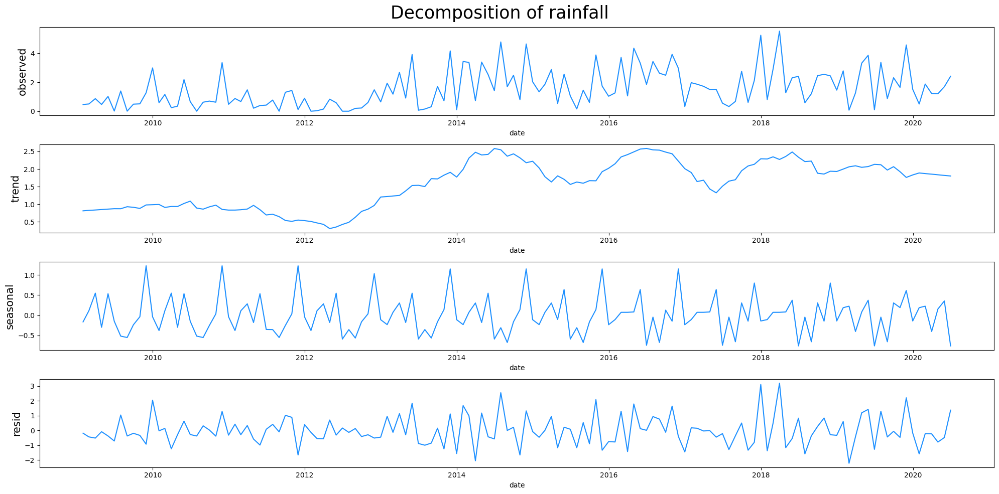

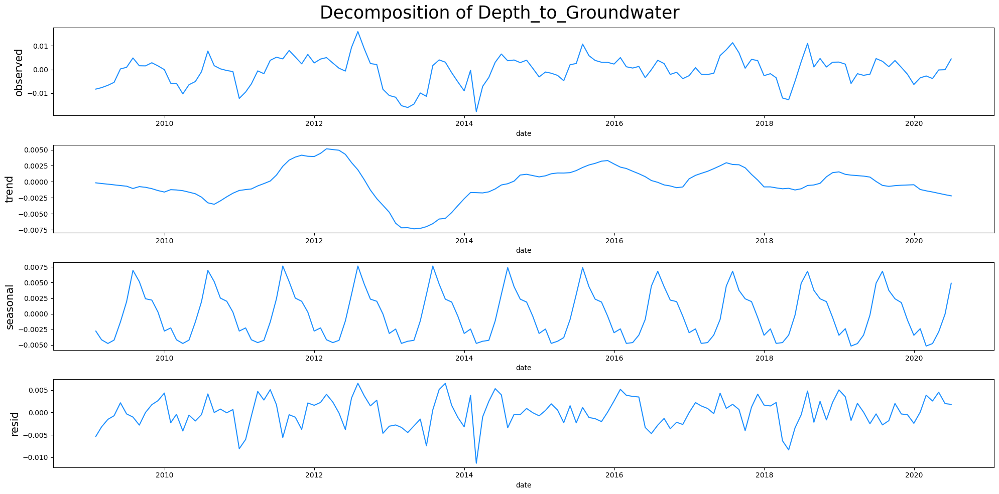

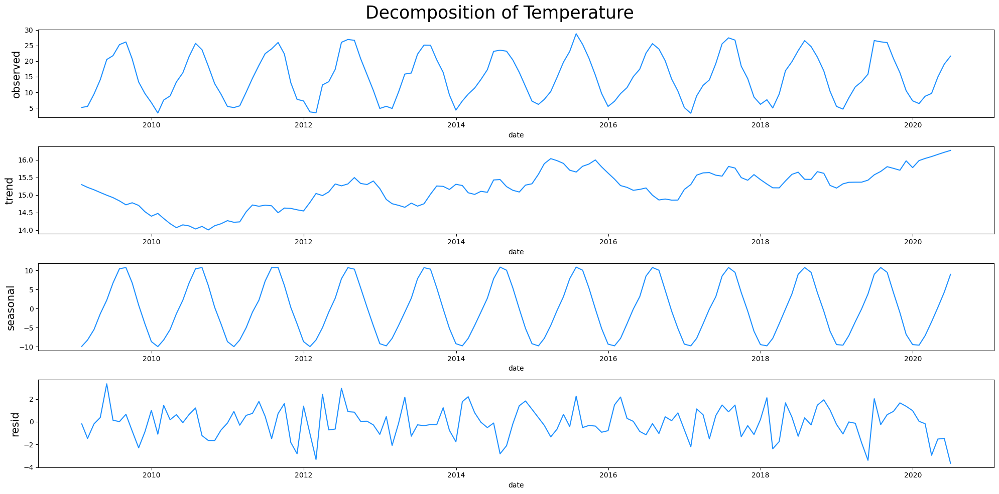

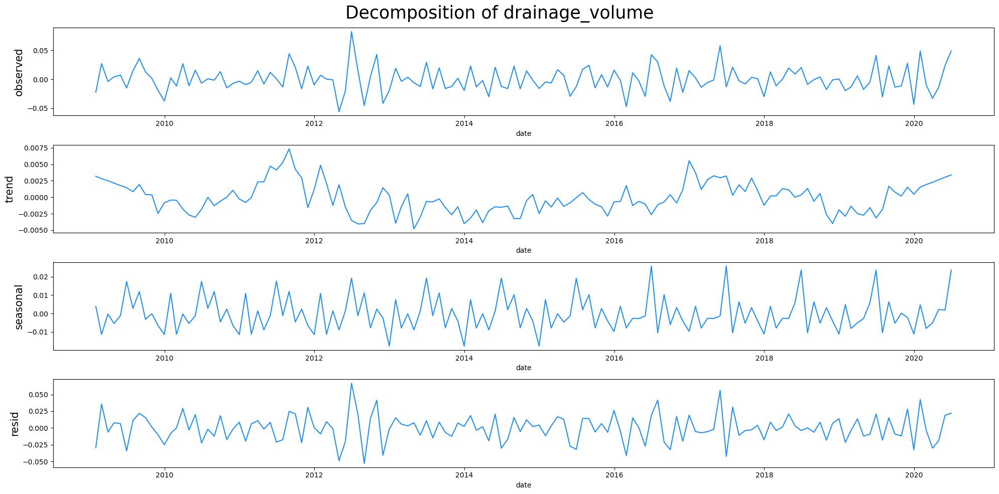

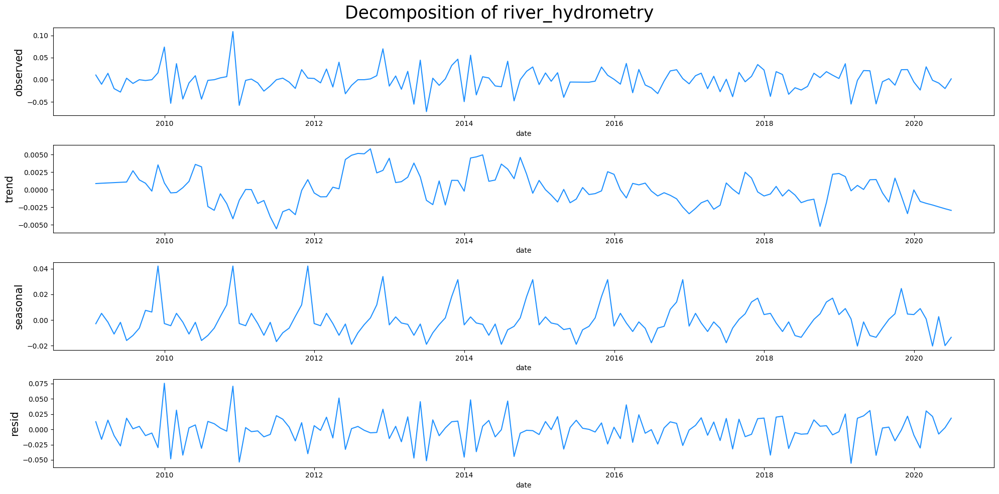

In [205]:
# TimeSeries Decomposition

from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns

def decomp(col):
    decop = seasonal_decompose(df_[col], period=52, model='additive', extrapolate_trend='freq')
    
    df_[f'{col}_trend'] = decop.trend
    df_[f'{col}_seasonal'] = decop.seasonal
    
    df_t = pd.DataFrame(index=range(len(decop.observed)))
    
    df_t['date'] = df_['date']
    df_t['observed'] = decop.observed
    df_t['trend'] = decop.trend
    df_t['seasonal'] = decop.seasonal
    df_t['resid'] = decop.resid
    df_t = df_t[['date', 'observed', 'trend', 'seasonal', 'resid']].resample('M', on='date').mean().reset_index().ffill()
    
    fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(20, 10))
    fig.suptitle('Decomposition of {}'.format(col), fontsize=25)
    
    for i, col in enumerate(df_t.columns[1:]):
        sns.lineplot(data=df_t, x='date', y=col, ax=ax[i], color='dodgerblue')
        ax[i].set_ylabel(col, fontsize=15)
    
    plt.tight_layout()
    plt.show()

# Call the function for each column
decomp('rainfall')
decomp('Depth_to_Groundwater')
decomp('Temperature')
decomp('drainage_volume')
decomp('river_hydrometry')



In [207]:
pd.set_option('display.max_columns', None)
df_.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,year,month,week,day,quarter,season,seas,week_sin,week_cos,rainfall_trend,rainfall_seasonal,Depth_to_Groundwater_trend,Depth_to_Groundwater_seasonal,Temperature_trend,Temperature_seasonal,drainage_volume_trend,drainage_volume_seasonal,river_hydrometry_trend,river_hydrometry_seasonal
0,2009-01-01,0.000000,0.000000,1.657143,0.000000,0.000000,2009,1,1,1,1,1,Winter,0.118273,0.992981,0.806294,0.688948,-0.000125,-0.004786,15.329959,-9.739920,0.003355,-0.024536,0.000857,0.003347
1,2009-01-08,0.285714,-0.008548,4.571429,0.054947,-0.024391,2009,1,2,8,1,1,Winter,0.234886,0.972023,0.809093,-0.728055,-0.000150,-0.002543,15.312814,-9.838787,0.003274,0.022086,0.000868,-0.008630
2,2009-01-15,0.028571,-0.011904,7.528571,-0.155790,-0.006192,2009,1,3,15,1,1,Winter,0.348202,0.93742,0.811892,-0.717139,-0.000174,-0.002321,15.295668,-10.002955,0.003193,0.000576,0.000878,-0.028414
3,2009-01-22,0.585714,-0.013284,6.214286,-0.065264,0.083382,2009,1,4,22,1,1,Winter,0.456629,0.889657,0.814691,0.493481,-0.000198,-0.002319,15.278522,-9.973161,0.003112,0.011333,0.000888,0.010304
4,2009-01-29,1.414286,-0.007643,5.771429,0.055292,0.000000,2009,1,5,29,1,1,Winter,0.558647,0.829406,0.817490,-0.556499,-0.000223,-0.001867,15.261377,-10.246938,0.003031,0.009871,0.000898,0.008864


In [209]:
# calculate each variable with a shift() (lag) to compare the correlationwith the other variables.
for col in df.columns[1:6]:
    df_[f'{col}_shift_p_2m']= df_[f'{col}_seasonal'].shift(-2*4)
    df_[f'{col}_shift_p_1m']= df_[f'{col}_seasonal'].shift(-1*4)
    df_[f'{col}_shift_1m']= df_[f'{col}_seasonal'].shift(1*4)
    df_[f'{col}_shift_2m']= df_[f'{col}_seasonal'].shift(2*4)
    df_[f'{col}_shift_3m']= df_[f'{col}_seasonal'].shift(3*4)  

In [211]:
df_.head()

,date,rainfall,Depth_to_Groundwater,Temperature,drainage_volume,river_hydrometry,year,month,week,day,quarter,season,seas,week_sin,week_cos,rainfall_trend,rainfall_seasonal,Depth_to_Groundwater_trend,Depth_to_Groundwater_seasonal,Temperature_trend,Temperature_seasonal,drainage_volume_trend,drainage_volume_seasonal,river_hydrometry_trend,river_hydrometry_seasonal,rainfall_shift_p_2m,rainfall_shift_p_1m,rainfall_shift_1m,rainfall_shift_2m,rainfall_shift_3m,Depth_to_Groundwater_shift_p_2m,Depth_to_Groundwater_shift_p_1m,Depth_to_Groundwater_shift_1m,Depth_to_Groundwater_shift_2m,Depth_to_Groundwater_shift_3m,Temperature_shift_p_2m,Temperature_shift_p_1m,Temperature_shift_1m,Temperature_shift_2m,Temperature_shift_3m,drainage_volume_shift_p_2m,drainage_volume_shift_p_1m,drainage_volume_shift_1m,drainage_volume_shift_2m,drainage_volume_shift_3m,river_hydrometry_shift_p_2m,river_hydrometry_shift_p_1m,river_hydrometry_shift_1m,river_hydrometry_shift_2m,river_hydrometry_shift_3m
0,2009-01-01,0.000000,0.000000,1.657143,0.000000,0.000000,2009,1,1,1,1,1,Winter,0.118273,0.992981,0.806294,0.688948,-0.000125,-0.004786,15.329959,-9.739920,0.003355,-0.024536,0.000857,0.003347,-0.397800,-0.556499,NaN,NaN,NaN,-0.006966,-0.001867,NaN,NaN,NaN,-7.416165,-10.246938,NaN,NaN,NaN,-0.021916,0.009871,NaN,NaN,NaN,-0.016623,0.008864,NaN,NaN,NaN
1,2009-01-08,0.285714,-0.008548,4.571429,0.054947,-0.024391,2009,1,2,8,1,1,Winter,0.234886,0.972023,0.809093,-0.728055,-0.000150,-0.002543,15.312814,-9.838787,0.003274,0.022086,0.000868,-0.008630,0.200034,0.354018,NaN,NaN,NaN,-0.005486,-0.003155,NaN,NaN,NaN,-7.342437,-9.014362,NaN,NaN,NaN,0.007623,-0.006175,NaN,NaN,NaN,-0.000126,0.029938,NaN,NaN,NaN
2,2009-01-15,0.028571,-0.011904,7.528571,-0.155790,-0.006192,2009,1,3,15,1,1,Winter,0.348202,0.93742,0.811892,-0.717139,-0.000174,-0.002321,15.295668,-10.002955,0.003193,0.000576,0.000878,-0.028414,1.974012,1.365095,NaN,NaN,NaN,-0.003978,-0.002282,NaN,NaN,NaN,-6.027661,-8.892924,NaN,NaN,NaN,0.007357,0.008305,NaN,NaN,NaN,0.036355,0.023834,NaN,NaN,NaN
3,2009-01-22,0.585714,-0.013284,6.214286,-0.065264,0.083382,2009,1,4,22,1,1,Winter,0.456629,0.889657,0.814691,0.493481,-0.000198,-0.002319,15.278522,-9.973161,0.003112,0.011333,0.000888,0.010304,0.237551,-0.874090,NaN,NaN,NaN,-0.003990,-0.004233,NaN,NaN,NaN,-5.150751,-7.763839,NaN,NaN,NaN,-0.005913,-0.025541,NaN,NaN,NaN,-0.008414,-0.016443,NaN,NaN,NaN
4,2009-01-29,1.414286,-0.007643,5.771429,0.055292,0.000000,2009,1,5,29,1,1,Winter,0.558647,0.829406,0.817490,-0.556499,-0.000223,-0.001867,15.261377,-10.246938,0.003031,0.009871,0.000898,0.008864,-0.219126,-0.397800,0.688948,NaN,NaN,-0.005565,-0.006966,-0.004786,NaN,NaN,-3.571014,-7.416165,-9.73992,NaN,NaN,-0.010314,-0.021916,-0.024536,NaN,NaN,-0.034501,-0.016623,0.003347,NaN,NaN


<Axes: >

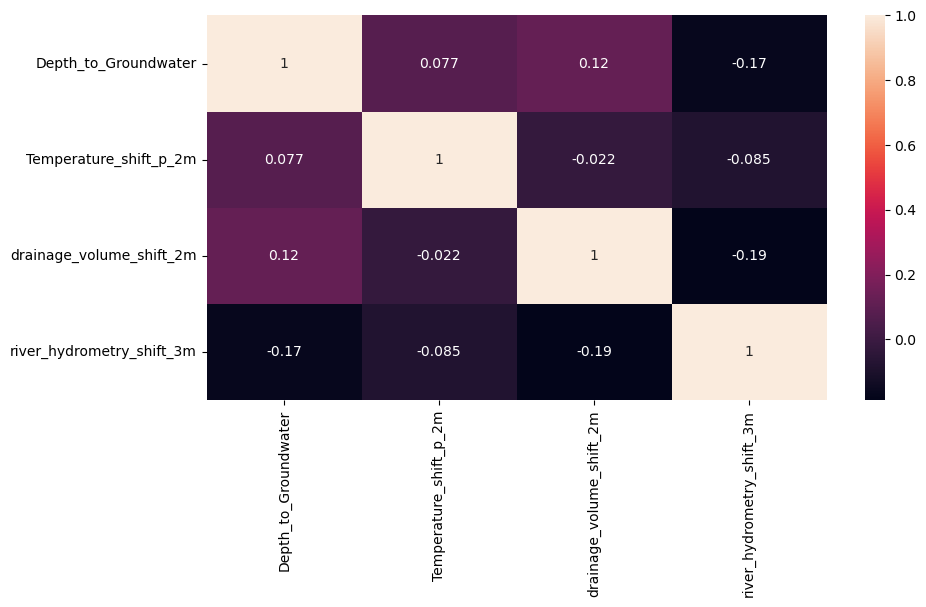

In [213]:
col=['Depth_to_Groundwater','Temperature_shift_p_2m',
    'drainage_volume_shift_2m','river_hydrometry_shift_3m']

a= df_[col].corr()
sns.heatmap(a, annot=True)

<Axes: >

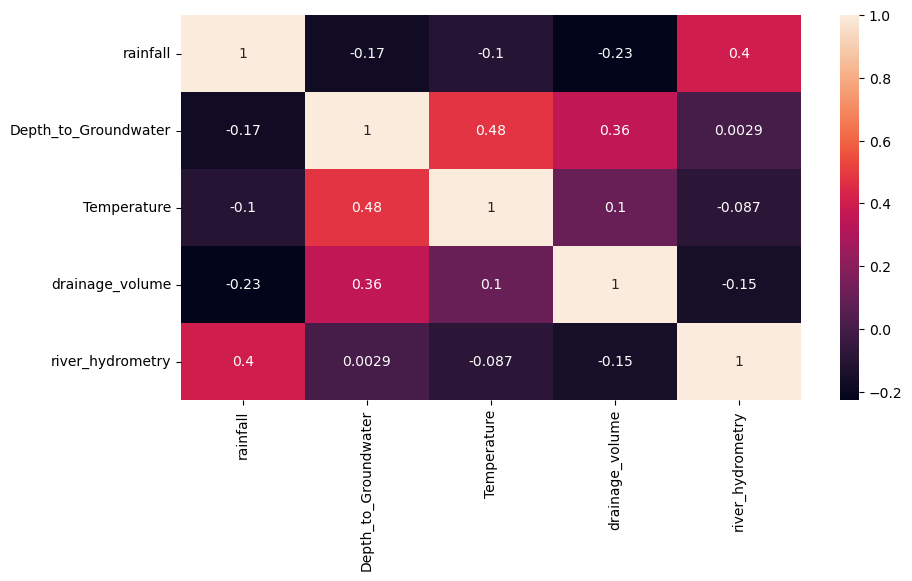

In [215]:

co=['rainfall','Depth_to_Groundwater','Temperature','drainage_volume','river_hydrometry']
a= df_[co].corr()
sns.heatmap(a, annot=True)

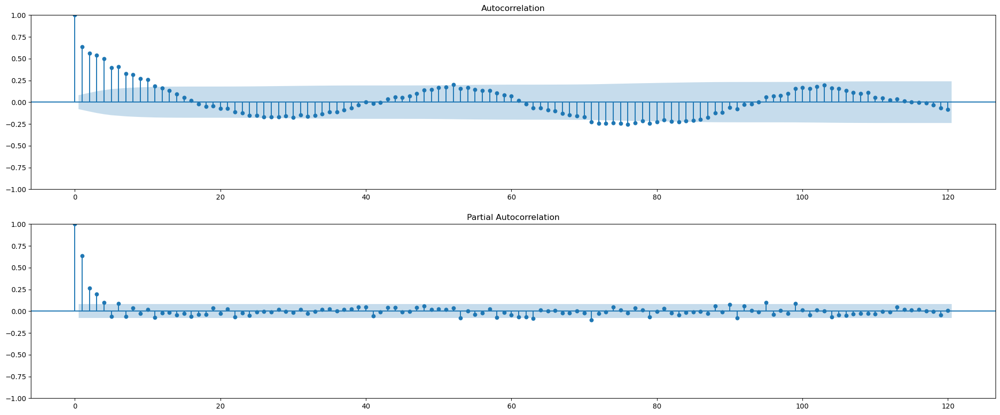

In [217]:
# ploting Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF)

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, ax= plt.subplots(nrows=2, ncols=1, figsize=(25,10))

plot_acf(df_['Depth_to_Groundwater'],lags=len(df)/5, ax=ax[0])
plot_pacf(df_['Depth_to_Groundwater'], lags=len(df)/5, ax=ax[1])

plt.show()

Modeling

1. Arima Model

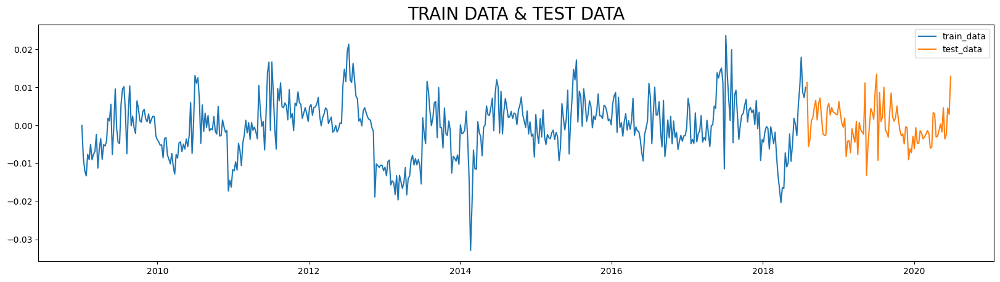

In [220]:
# fiting the model
df_1= df_[['date','Depth_to_Groundwater']]
df_1.set_index('date', inplace=True)


train_end= datetime(2018,7,26)
test_end= datetime(2020,12,3)

train_data= df_1[:train_end]
test_data= df_1[train_end+timedelta(1):test_end]

model= ARIMA(train_data, order=(4,1,4))
model_fit= model.fit()

def plot_(train, test):
    
    plt.subplots(nrows=1, ncols=1, figsize=(20,5))
    plt.plot(train_data, label='train_data')
    plt.plot(test_data, label='test_data')
    plt.title('TRAIN DATA & TEST DATA', fontsize=20)
    plt.legend()

plot_(train_data, test_data)

In [222]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:     Depth_to_Groundwater   No. Observations:                  500
Model:                   ARIMA(4, 1, 4)   Log Likelihood                1913.697
Date:                  Tue, 17 Sep 2024   AIC                          -3809.394
Time:                          14:03:38   BIC                          -3771.481
Sample:                      01-01-2009   HQIC                         -3794.516
                           - 07-26-2018                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1226      0.499     -2.249      0.025      -2.101      -0.144
ar.L2         -0.5944      0.707     -0.841      0.400      -1.980       0.791
ar.L3         -0.1396      0.393     -0.356      0.722      -0.909       0.630
ar.L4          0.1670      0.113      1.483      0.138      -0.054       0.388
ma.L1          0.6081      0.509      1.195      0.232      -0.389       1.605
ma.L2         -0.0776      0.479     -0.162      0.871      -1.017       0.862
ma.L3         -0.2198      0.144     -1.532      0.126      -0.501       0.061
ma.L4         -0.1840      0.194     -0.949      0.342      -0.564       0.196
sigma2      2.729e-05   1.25e-06     21.828      0.000    2.48e-05    2.97e-05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               135.12
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               1.26   Skew:                            -0.19
Prob(H) (two-sided):                  0.14   Kurtosis:                         5.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [224]:
# predict
prediction= model_fit.predict(test_data.index[0],test_data.index[-1])

In [226]:
df1= pd.DataFrame(prediction)
df2= pd.DataFrame(test_data)
df3= df2.join(df1)
df3.rename(columns={'Depth_to_Groundwater':'test'}, inplace= True)
df3['res']= df3.test -  df3.predicted_mean

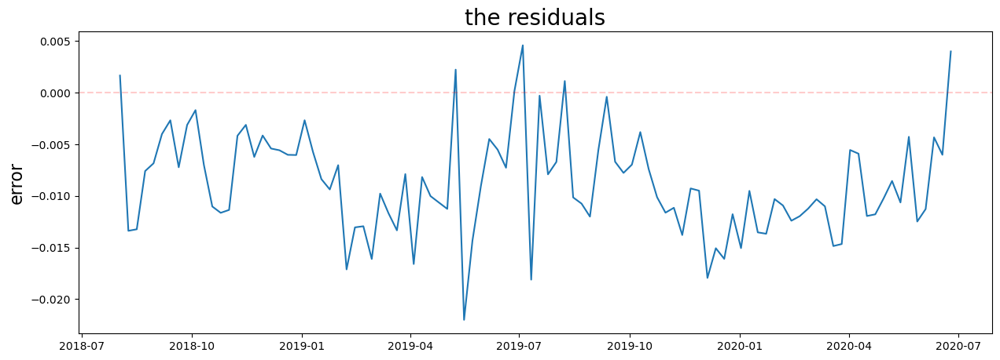

In [228]:
#ploting the residuals (test data - prediction)
def plot(df):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.title("the residuals", fontsize=20)
    plt.ylabel('error', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
#     plt.xlim(datetime(2019,7),datetime(2021,1))
#     for year in range(2018,2021):
#         plt.axvline(pd.to_datetime(str(year)), color='k', linestyle='--', alpha=0.2)

plot(df3['res'])

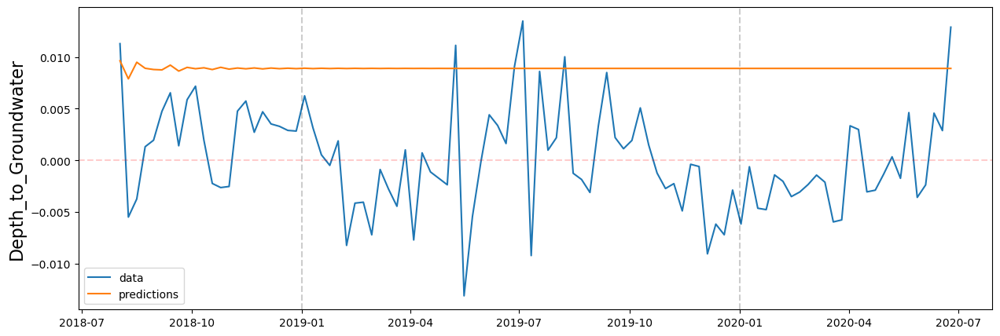

In [230]:
# ploting the fitline
# (as we can see the fitline cant fit the data so we gonna use rolling foracast method)
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
    for year in range(2019,2021):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
        
plot(df3['test'], df3['predicted_mean'])

In [232]:
print('mean absolute percent error', round(np.mean(abs(df3['res']/df3['test'])),4))

mean absolute percent error 4.805


In [239]:
print('root mean squared error', np.sqrt(np.mean(df3['res']**2)))

root mean squared error 0.010064960409911151


In [244]:
# rolling forecast
prediction= pd.Series()
for end_date in test_data.index:
    train_data= df_1[:end_date - timedelta(days=1)]
    model= ARIMA(train_data, order=(4,1,4))
    model_fit= model.fit()
    predict= model_fit.predict(test_data.index[0],end_date)
    prediction.loc[end_date]= predict.loc[end_date]

In [237]:
res= df3['test']-prediction

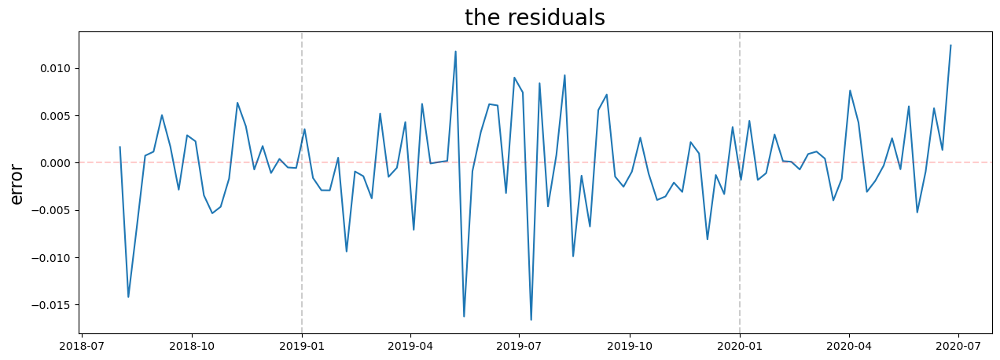

In [238]:
#ploting the residuals (test data - prediction)
def plot(df):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.title("the residuals", fontsize=20)
    plt.ylabel('error', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
#     plt.xlim(datetime(2019,7),datetime(2021,1))
    for year in range(2019,2021):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

plot(res)

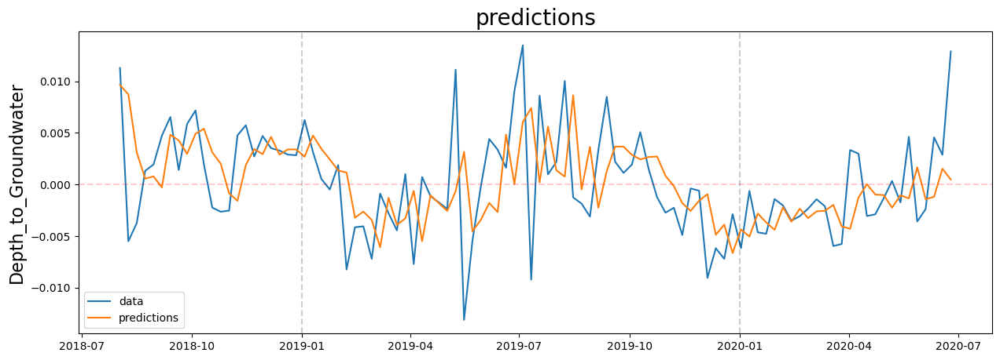

In [245]:
#ploting the fit line
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
    for year in range(2019,2021):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
        
plot(df3['test'], prediction)

In [248]:
print('mean absolute percent error', round(np.mean(abs(res/df3['test'])),4))

mean absolute percent error 1.5922


In [250]:
print('root mean squared error', np.sqrt(np.mean(res**2)))

root mean squared error 0.005088547902457895


In [252]:
#forcast 2 month period in future
forcast= model_fit.predict(datetime(2020,12,3),datetime(2021,2,3))

In [254]:
new=forcast.to_frame()
new= new.rename(columns={'predicted_mean':'Depth_to_Groundwater'})
c_i= pd.concat([df_1,new])

In [258]:
import scipy.stats as st
import numpy as np

# Assume c_i is a pandas Series or numpy array of data for which you want the confidence intervals
# Example data for c_i
# c_i = pd.Series(np.random.randn(100))

# Calculate the confidence interval
confidence = 0.95
mean_c_i = np.mean(c_i)
sem_c_i = st.sem(c_i)

ci = st.norm.interval(confidence, loc=mean_c_i, scale=sem_c_i)

# Calculate the range for the confidence interval
c = ci[1] - ci[0]  # Note: usually c is the width of the confidence interval, so it should be the difference

# Assuming 'forcast' is a pandas DataFrame or Series with the same length as 'c_i'
# Example forecast data for range calculation
# forcast = pd.Series(np.random.randn(10))

range_ = c_i.tail(len(forcast))

# Calculate upper and lower bounds of the confidence interval
upper = range_ + c
lower = range_ - c
lower = lower.iloc[:, 0] if isinstance(lower, pd.DataFrame) else lower
upper = upper.iloc[:, 0] if isinstance(upper, pd.DataFrame) else upper

print("Lower bounds:")
print(lower)
print("Upper bounds:")
print(upper)


Lower bounds:
2020-12-03    0.000088
2020-12-10    0.000035
2020-12-17    0.000084
2020-12-24    0.000039
2020-12-31    0.000080
2021-01-07    0.000042
2021-01-14    0.000077
2021-01-21    0.000045
2021-01-28    0.000074
2021-02-04    0.000048
Name: Depth_to_Groundwater, dtype: float64
Upper bounds:
2020-12-03    0.002319
2020-12-10    0.002266
2020-12-17    0.002315
2020-12-24    0.002270
2020-12-31    0.002311
2021-01-07    0.002273
2021-01-14    0.002308
2021-01-21    0.002276
2021-01-28    0.002305
2021-02-04    0.002279
Name: Depth_to_Groundwater, dtype: float64


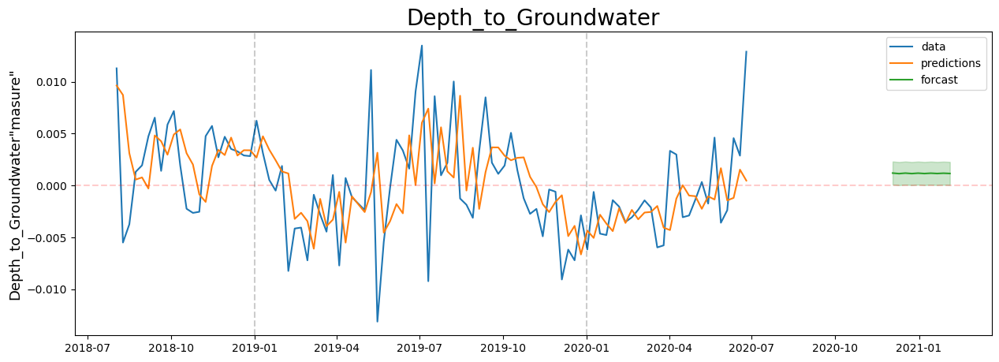

In [260]:
def plot(df,df1,df2):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.plot(df2)
    plt.fill_between(forcast.index,lower,upper,color='g', alpha=0.2, label='Confidence Intervals')
    plt.legend(('data', 'predictions','forcast'), fontsize=10)
    plt.title("Depth_to_Groundwater", fontsize=20)
    plt.ylabel('Depth_to_Groundwater"masure"', fontsize= 13)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
    for year in range(2019,2021):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    
        
plot(df3['test'], prediction, forcast)

In [262]:
# reverse the differentiation and log transform
new=forcast.to_frame()
new= new.rename(columns={'predicted_mean':'Depth_to_Groundwater'})
df_2= pd.concat([df_1,new])

df_2.iloc[0]= np.log(abs(df.Depth_to_Groundwater.iloc[0]))
org_df= np.exp(df_2.cumsum())
org_df= -abs(org_df)

In [264]:

#our forecast data
forcast_values= org_df.iloc[-5:].style.background_gradient()
forcast_values

,Depth_to_Groundwater
2021-01-07 00:00:00,-25.323178
2021-01-14 00:00:00,-25.353391
2021-01-21 00:00:00,-25.382835
2021-01-28 00:00:00,-25.413051
2021-02-04 00:00:00,-25.442627


In [268]:
import scipy.stats as st
import numpy as np
import pandas as pd

# Assume org_df is a pandas DataFrame or Series with the data you want to analyze
# Example data for org_df
# org_df = pd.Series(np.random.randn(100))

# Calculate the confidence interval
confidence = 0.95
mean_org_df = np.mean(org_df)
sem_org_df = st.sem(org_df)

ci = st.norm.interval(confidence, loc=mean_org_df, scale=sem_org_df)

# Width of the confidence interval
c = ci[1] - ci[0]

# Define the range as the last 5 observations from org_df
range_ = org_df.tail(5)

# Calculate the upper and lower bounds
upper = range_ + c
lower = range_ - c

# If org_df is a DataFrame, select the first column
if isinstance(lower, pd.DataFrame):
    lower = lower.iloc[:, 0]
if isinstance(upper, pd.DataFrame):
    upper = upper.iloc[:, 0]

print("Lower bounds:")
print(lower)
print("Upper bounds:")
print(upper)


Lower bounds:
2021-01-07   -25.788156
2021-01-14   -25.818369
2021-01-21   -25.847813
2021-01-28   -25.878030
2021-02-04   -25.907605
Name: Depth_to_Groundwater, dtype: float64
Upper bounds:
2021-01-07   -24.858199
2021-01-14   -24.888412
2021-01-21   -24.917856
2021-01-28   -24.948073
2021-02-04   -24.977648
Name: Depth_to_Groundwater, dtype: float64


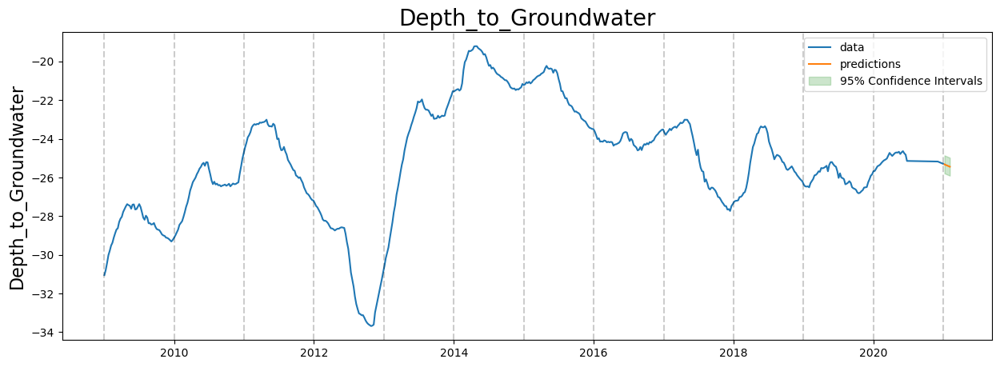

In [270]:
#ploting the original data with our forecast
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.fill_between(range_.index,lower,upper,color='g', alpha=0.2, label='Confidence Intervals')
    plt.legend(('data', 'predictions','95% Confidence Intervals'), fontsize=10)
    plt.title("Depth_to_Groundwater", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    for year in range(2009,2022):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
#     plt.xlim(datetime(2018,1,1), datetime(2021,1,7))
        
plot(org_df['Depth_to_Groundwater'][:-5], org_df['Depth_to_Groundwater'][-5:])

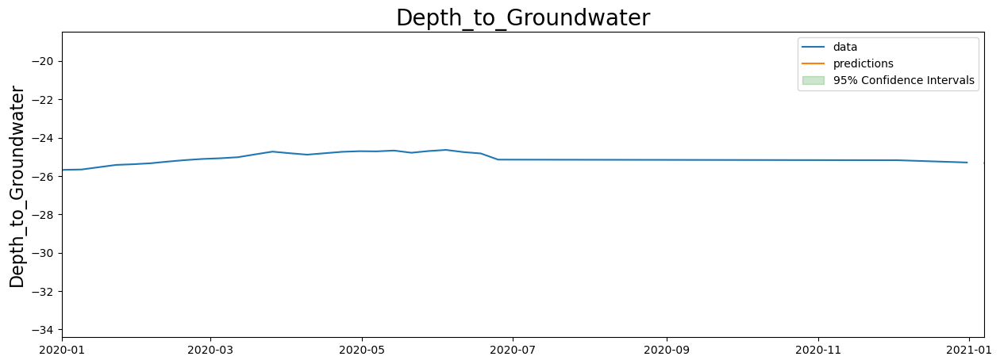

In [272]:
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.fill_between(range_.index,lower,upper,color='g', alpha=0.2)
    plt.legend(('data', 'predictions','95% Confidence Intervals'), fontsize=10)
    plt.title("Depth_to_Groundwater", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.xlim(datetime(2020,1,1), datetime(2021,1,7))
        
plot(org_df['Depth_to_Groundwater'][:-5], org_df['Depth_to_Groundwater'][-5:])

2. Auto Arima

In [280]:
from pmdarima.arima import auto_arima as am

In [282]:
# fiting the model
model_fit1= am(train_data, start_p=1, start_q=1,
                      test='adf',
                      max_p=5, max_q=5,
                      m=1,             
                      d=1,          
                      seasonal=False,
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)
print(model_fit1.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-4572.185, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-4410.549, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-4511.308, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-4572.716, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-4412.548, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-4573.130, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-4571.085, Time=0.72 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-4572.561, Time=1.47 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=-4575.111, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-4574.696, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=-4573.066, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-4574.166, Time=0.40 sec
 ARIMA(1,1,3)(0,0,0)[0]        

In [284]:
# predict
prediction, confint = model_fit1.predict(n_periods=len(test_data), return_conf_int=True)

In [286]:
res= test_data['Depth_to_Groundwater'].to_numpy() - prediction

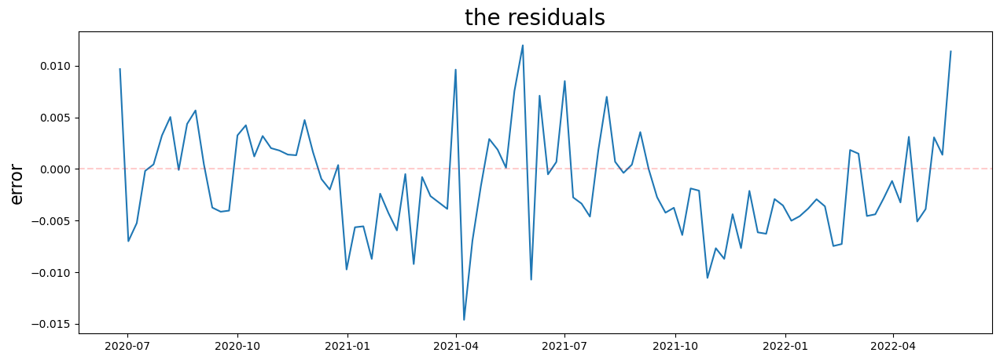

In [288]:
def res_(df):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.title("the residuals", fontsize=20)
    plt.ylabel('error', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)

res_(res)

In [306]:
pred= prediction.to_frame().set_index(test_data.index)
ci= pd.DataFrame(confint)

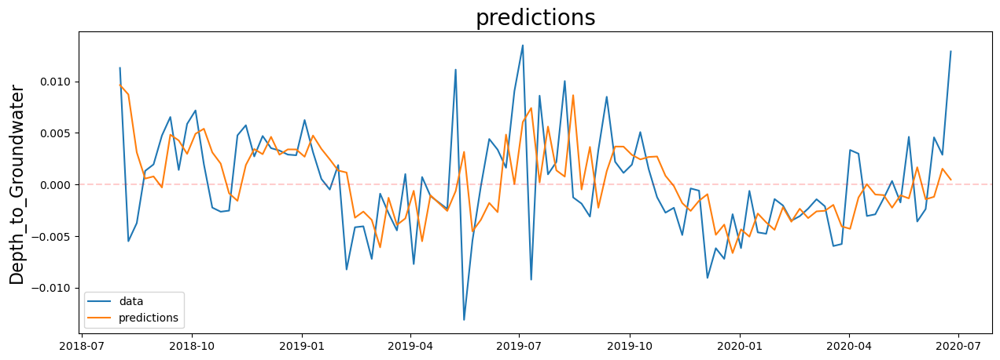

In [307]:
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
#     for year in range(2019,2021):
#         plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
        
plot(test_data, pred)

In [294]:
print('root mean squared error', np.sqrt(np.mean(res**2)))

root mean squared error 0.005170910612745827


In [299]:

# rolling forecast
prediction= pd.Series()
for end_date in test_data.index:
    train_data= df_1[:end_date - timedelta(days=1)]
    model= ARIMA(train_data, order= model.order)
    model_fit= model.fit()
    predict= model_fit.predict(test_data.index[0],end_date)
    prediction.loc[end_date]= predict.loc[end_date]

In [297]:
res= test_data['Depth_to_Groundwater'].to_numpy() - prediction

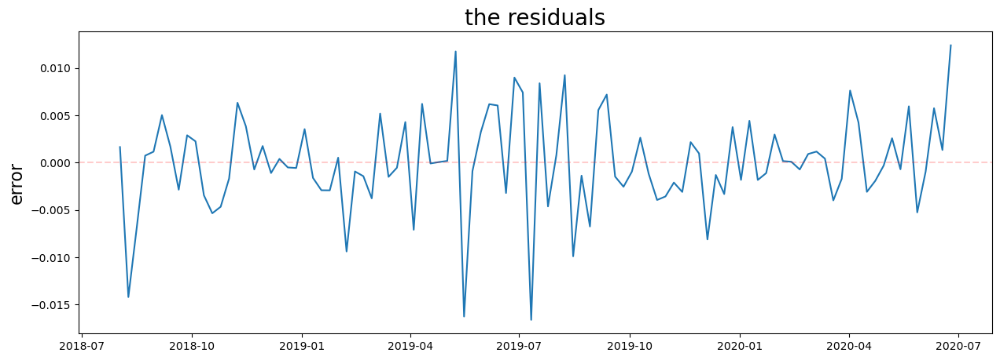

In [298]:
# the residuals after rolling forecast
def res_(df):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.title("the residuals", fontsize=20)
    plt.ylabel('error', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)

res_(res)

In [304]:
pred= prediction.to_frame().set_index(test_data.index)

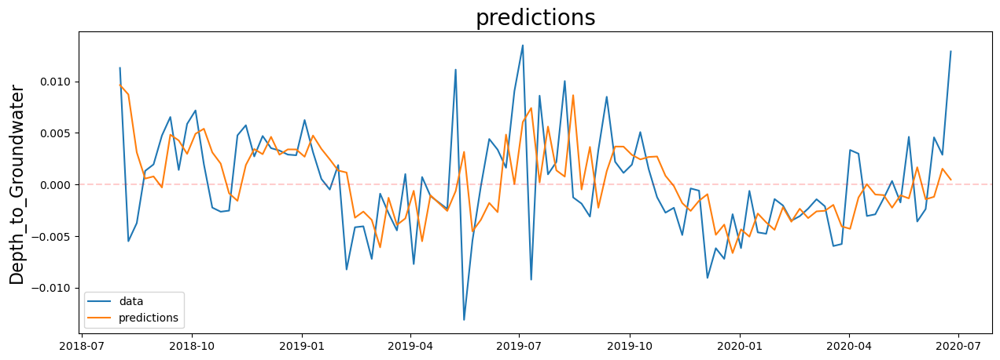

In [305]:
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
#     for year in range(2019,2021):
#         plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
        
plot(test_data, pred)

In [313]:
print('root mean squared error', np.sqrt(np.mean(res**2)))

root mean squared error 0.005088547902457895


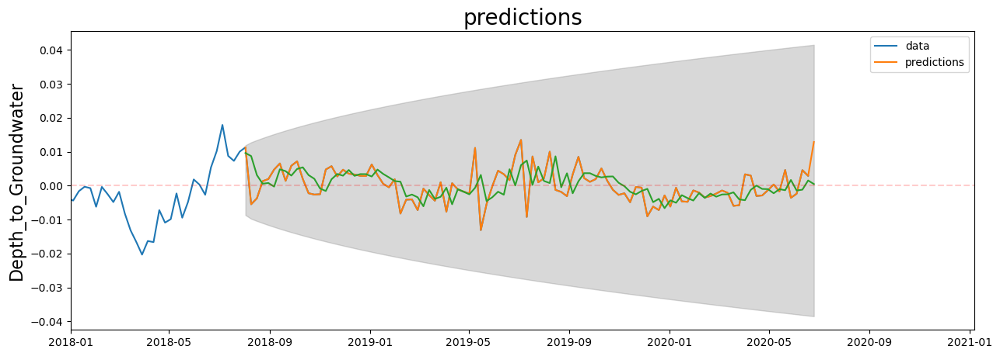

In [315]:
# ploting the fit line
def plot(df,df1,df2):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.plot(df2)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
    plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
#     for year in range(2019,2021):
#         plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    plt.xlim(datetime(2018,1,1), datetime(2021,1,7))
    plt.fill_between(df2.index,ci[0],ci[1],color='grey',alpha=.3)
        
plot(train_data, test_data, pred)

In [355]:
# forecasting 11 periods in future
forcast, con = model_fit1.predict(n_periods=11, return_conf_int=True)

In [357]:
forcast= forcast.to_frame()
ci1= pd.DataFrame(con)

In [359]:
forcast=forcast[-5:].values

In [363]:
from dateutil import rrule, parser

date1 = '2020-08-10'
date2 = '2020-09-07'

dates = list(rrule.rrule(rrule.WEEKLY,
                          dtstart=parser.parse(date1),
                          until=parser.parse(date2)))

In [365]:
import pandas as pd
from datetime import datetime

# Check shapes
print(forcast.shape)  # Should be (11,)
print(con.shape)      # Should be (11, 2)

# Ensure forcast is a 1D array
if forcast.ndim == 1:
    forcast = forcast.reshape(-1, 1)

# Create DataFrames with correct indices
forecast_df = pd.DataFrame(forcast, columns=['forecast'], index=pd.date_range(start='2021-01-01', periods=len(forcast), freq='W'))
ci1_df = pd.DataFrame(con, columns=['lower', 'upper'], index=pd.date_range(start='2021-01-01', periods=len(con), freq='W'))


(5, 1)
(11, 2)


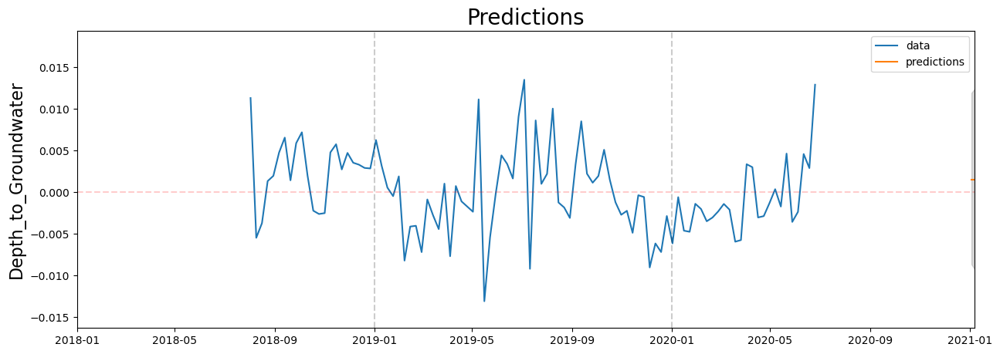

In [367]:
import matplotlib.pyplot as plt
import pandas as pd

def plot(df, df1, ci1):
    plt.figure(figsize=(15,5))
    plt.plot(df.index, df, label='data')
    plt.plot(df1.index, df1, label='predictions')
    plt.fill_between(ci1.index, ci1['lower'], ci1['upper'], color='gray', alpha=.3)
    plt.legend(fontsize=10)
    plt.title("Predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize=16)
    plt.axhline(0, color='r', linestyle='--', alpha=0.2)
    for year in range(2019, 2021):
        plt.axvline(pd.to_datetime(str(year) + '-01-01'), color='k', linestyle='--', alpha=0.2)
    plt.xlim(datetime(2018,1,1), datetime(2021,1,7))
    plt.show()

# Plot the results
plot(test_data, forecast_df['forecast'], ci1_df)


In [375]:
import pandas as pd
import numpy as np

# Convert forecast to DataFrame and rename columns
forecast_df = pd.DataFrame(forcast, columns=['forecast'])
forecast_df = forecast_df[-5:].rename(columns={'forecast': 'Depth_to_Groundwater'})

# Concatenate with historical data
df_2 = pd.concat([df_1, forecast_df])

# Reapply the log transform for the initial value
df_2.iloc[0] = np.log(abs(df.Depth_to_Groundwater.iloc[0]))

# Reverse the log transform and differentiation
org_df = np.exp(df_2.cumsum())
org_df = -abs(org_df)


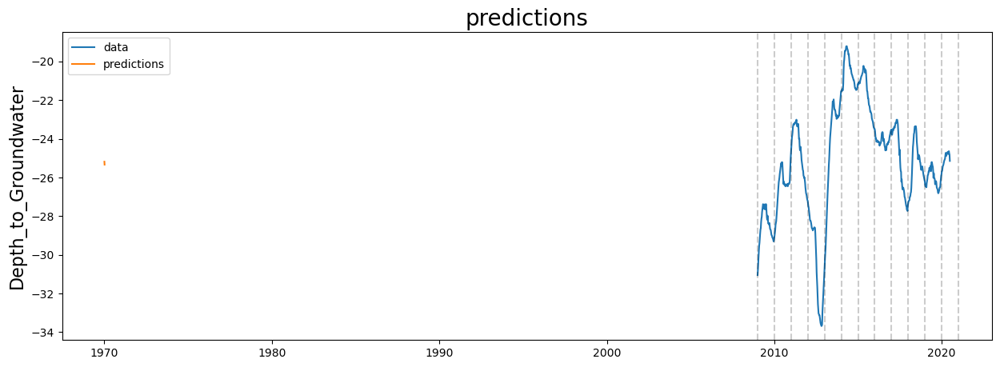

In [379]:
def plot(df,df1):
    plt.figure(figsize=(15,5))
    plt.plot(df)
    plt.plot(df1)
    plt.legend(('data', 'predictions'), fontsize=10)
    plt.title("predictions", fontsize=20)
    plt.ylabel('Depth_to_Groundwater', fontsize= 16)
#     plt.axhline(0, color= 'r', linestyle= '--', alpha= 0.2)
    for year in range(2009,2022):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
#     plt.xlim(datetime(2018,1,1), datetime(2021,1,7))
#     plt.fill_between(forcast.index,ci[0],ci[1],color='grey',alpha=.3)
        
plot(org_df['Depth_to_Groundwater'][:-5], org_df['Depth_to_Groundwater'][-5:])

In [381]:
forcast_values1= org_df.iloc[-5:].style.background_gradient()
forcast_values1

,Depth_to_Groundwater
0,-25.182950
1,-25.220956
2,-25.259020
3,-25.297141
4,-25.335320


In [383]:
# plot_pacf(res**2)
# plt.show()

In [385]:

# train_end= datetime(2018,7,26)
# test_end= datetime(2020,12,3)

# train_data= df_1[:train_end]
# test_data= df_1[train_end+timedelta(1):test_end]

In [387]:
# df_1= df_[['date','Depth_to_Groundwater']]
# df_1.set_index('date', inplace=True)